# This notebook is to calculate the Akaike information criterion (AIC) and Schwarz’s Bayesian Information Criterion (BIC) and the Silhouette score

# 1. Load training data

In [1]:
# define the path of the data and project
training_data_path = 'D:/VScode/MRes/Clustering_under_the_ice/training_data/'

In [2]:
# load the training data
import xarray as xr

ds_train_750_latlonT_5_60_95= xr.open_dataset(training_data_path + 'ds_train_750_latlonT_5_60_95.nc')
ds_train_750_latlonT_5_50_95= xr.open_dataset(training_data_path + 'ds_train_750_latlonT_5_50_95.nc')
ds_train_750_latlonT_5_70_95= xr.open_dataset(training_data_path + 'ds_train_750_latlonT_5_70_95.nc')

ds_train_250_latlonT_10_20_95= xr.open_dataset(training_data_path + 'ds_train_250_latlonT_10_20_95.nc')
ds_train_250_latlonT_10_10_95= xr.open_dataset(training_data_path + 'ds_train_250_latlonT_10_10_95.nc')
ds_train_250_latlonT_10_30_95= xr.open_dataset(training_data_path + 'ds_train_250_latlonT_10_30_95.nc')

# 2. Calculate the score of temperature and salinity on their Empirical Orthogonal Function (EOF) 

In [20]:
ds_train_750_latlonT_5_60_95['temperature'].values.shape

(22956, 148)

In [65]:
from sklearn.decomposition import PCA
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

def pca_score(ds_cleaned: pd.DataFrame, plot_figs: bool = False) -> np.ndarray:
    """
    Perform PCA on cleaned dataset and return the scores.
    
    Args:
        ds_cleaned (pd.DataFrame): Cleaned dataset with temperature and salinity variables.
        plot_figs (bool, optional): Whether to plot the figures. Defaults to False.
    
    Returns:
        np.ndarray: Array of PCA scores for temperature and salinity.
    """
    # Normalize the data
    scaler = StandardScaler()
    temp_scaled = scaler.fit_transform(ds_cleaned['temperature'].values)
    san_scaled = scaler.fit_transform(ds_cleaned['salinity'].values)
    print(f'shape of the scaled temperature: {temp_scaled.shape}')
    
    n_pc = 2  # number of principal components
    pca_T = PCA(n_components=n_pc, svd_solver='full')
    pca_S = PCA(n_components=n_pc)
    columns = [f'EOF {i}' for i in range(1, n_pc + 1)]
    
    fitted_temp = pca_T.fit(temp_scaled)
    EOFs_temp = fitted_temp.components_.T
    EOFs_temp_df = pd.DataFrame(data=EOFs_temp, columns=columns)
    print(f'shape of the EOFs for temperature: {EOFs_temp.shape}')
    
    # PCA for salinity
    fitted_san = pca_S.fit(san_scaled)
    EOFs_san = fitted_san.components_.T
    EOFs_san_df = pd.DataFrame(data=EOFs_san, columns=columns)
    
    v_exp_temp = pca_T.explained_variance_ratio_
    v_exp_san = pca_S.explained_variance_ratio_
    
    print(f'variation explained by EOF1 and EOF2 for temperature: {v_exp_temp}')
    print(f'variation explained by EOF1 and EOF2 for salinity: {v_exp_san}')
    
    temp_score = temp_scaled.dot(EOFs_temp)
    san_score = san_scaled.dot(EOFs_san)
    
    print(f'shape of the score for temperature: {temp_score.shape}')
    
    if plot_figs:
        plot_EOFs(EOFs_temp_df, EOFs_san_df, ds_cleaned, v_exp_temp, v_exp_san)
        plot_score(temp_score, san_score)
    
    temp_san_score = np.concatenate((temp_score, san_score), axis=1)
    
    return temp_san_score

############################################################################################
# Function to plot the principal components

import matplotlib.pyplot as plt

def plot_EOFs(EOFs_temp_df: pd.DataFrame, EOFs_san_df: pd.DataFrame, ds_cleaned: pd.DataFrame,
              v_exp_temp: np.ndarray, v_exp_san: np.ndarray) -> None:
    """
    Plot the principal components for temperature and salinity.
    
    Args:
        EOFs_temp_df (pd.DataFrame): DataFrame containing EOFs for temperature.
        EOFs_san_df (pd.DataFrame): DataFrame containing EOFs for salinity.
        ds_cleaned (pd.DataFrame): Cleaned dataset with pressure column.
        v_exp_temp (np.ndarray): Array of explained variance ratios for temperature.
        v_exp_san (np.ndarray): Array of explained variance ratios for salinity.
    """
    # Create a figure with two subplots side by side
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=300)
    
    # Loop through all the PCs and plot them for temperature and salinity
    for i in range(EOFs_temp_df.shape[1]):
        # Plot the i-th PC for temperature in the left subplot
        axes[0].plot(EOFs_temp_df[f'EOF {i + 1}'], ds_cleaned['pressure'],
                     label=f'EOF {i + 1}, Exp_var:{v_exp_temp[i]:.2f}')
        # Add a grey vertical line at x==0
        axes[0].axvline(x=0, color='grey', linestyle='--')
        axes[0].set_title('Temperature')
        axes[0].set_xlabel('EOF Values')
        axes[0].set_ylabel('Pressure (dbar)')
        axes[0].legend()
        
        # Plot the i-th PC for salinity in the right subplot
        axes[1].plot(EOFs_san_df[f'EOF {i + 1}'], ds_cleaned['pressure'],
                     label=f'EOF {i + 1}, Exp_var:{v_exp_san[i]:.2f}')
        axes[1].axvline(x=0, color='grey', linestyle='--')
        axes[1].set_title('Salinity')
        axes[1].set_xlabel('EOF Values')
        axes[1].set_ylabel('Pressure (dbar)')
        axes[1].legend()
    
    # Adjust the spacing between the subplots
    fig.subplots_adjust(wspace=0.3)
    
    # Show the figure
    plt.show()

############################################################################################
# Function to plot the scores

def plot_score(temp_score: np.ndarray, san_score: np.ndarray) -> None:
    """
    Plot the histogram of scores for temperature and salinity.
    
    Args:
        temp_score (np.ndarray): Array of scores for temperature.
        san_score (np.ndarray): Array of scores for salinity.
    """
    n_cols = temp_score.shape[1]  # number of principal components
    fig, axs = plt.subplots(nrows=2, ncols=n_cols, figsize=(12, 8), dpi=300)
    
    for i in range(n_cols):
        axs[0, i].hist(temp_score[:, i], bins=100, density=True)
        axs[0, i].set_xlim(np.quantile(temp_score, 0.001), np.quantile(temp_score, 0.999))
        axs[0, i].set_xlabel(f'Temperature score on EOF {i + 1}')
        axs[0, i].set_ylabel('Probability density')
        
        axs[1, i].hist(san_score[:, i], bins=100, density=True)
        axs[1, i].set_xlim(np.quantile(san_score, 0.001), np.quantile(san_score, 0.999))
        axs[1, i].set_xlabel(f'Salinity score on EOF {i + 1}')
        axs[1, i].set_ylabel('Probability density')
    
    plt.tight_layout()
    plt.show()


shape of the scaled temperature: (22956, 148)
shape of the EOFs for temperature: (148, 2)
variation explained by EOF1 and EOF2 for temperature: [0.48960551 0.36887066]
variation explained by EOF1 and EOF2 for salinity: [0.8757647  0.05492674]
shape of the score for temperature: (22956, 2)


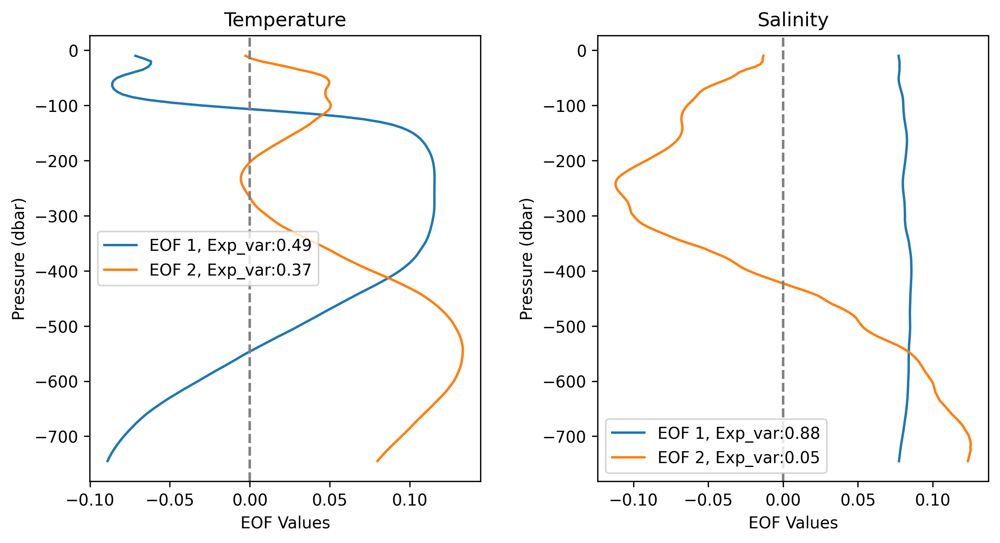

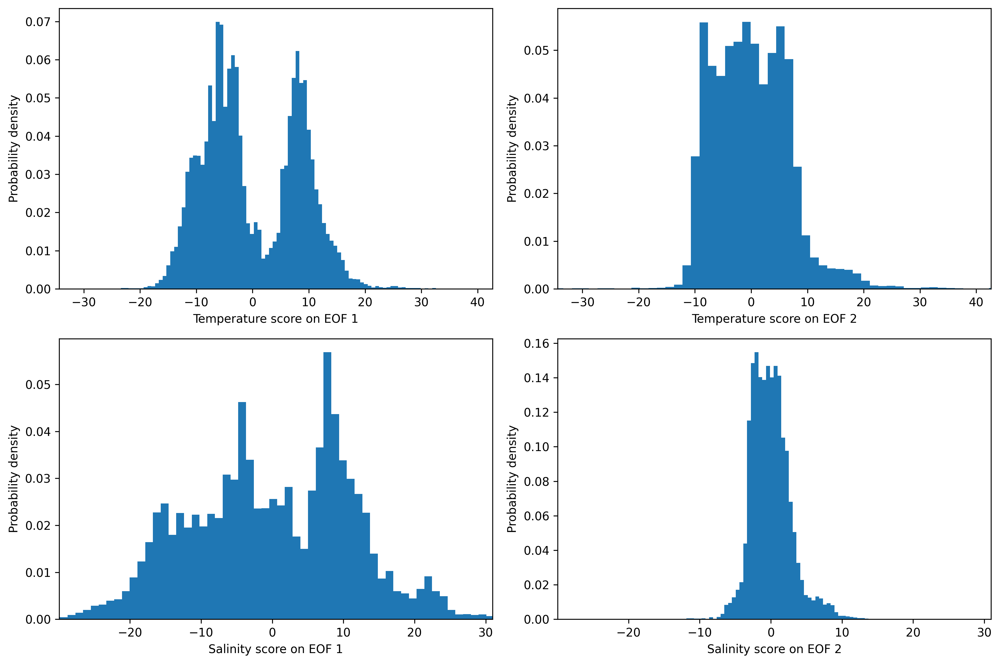

In [66]:
temp_san_score_750_latlonT_5_60_95=pca_score(ds_train_750_latlonT_5_60_95,plot_figs=True)

# 3. Calculate AIC, BIC and silhouette score using the temperature and salinity scores

In [64]:
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
import numpy as np
import matplotlib.pyplot as plt



def aic_bic_curve(temp_san_score: np.ndarray, max_components: int = 20) -> None:
    """
    Calculate AIC and BIC scores for different numbers of components in Gaussian Mixture Models (GMMs).
    
    Args:
        temp_san_score (np.ndarray): Array of PCA scores for temperature and salinity.
        max_components (int, optional): Maximum number of components to consider in the GMM. Defaults to 20.
    """
    aic = []
    bic = []
    
    for i in range(2, max_components):
        gmm_model = GaussianMixture(n_components=i, covariance_type='full')
        gmm_model.fit(temp_san_score)
        aic.append(gmm_model.aic(temp_san_score))
        bic.append(gmm_model.bic(temp_san_score))
    
    bic_grad = np.diff(bic)
    aic_grad = np.diff(aic)
    
    plt.figure(figsize=(12, 8), dpi=300)
    
    plt.subplot(2, 2, 1)
    plt.plot(range(2, max_components), aic)
    plt.xticks(range(2, max_components))
    plt.xlabel('Number of components')
    plt.ylabel('AIC score')
    plt.grid()
    
    plt.subplot(2, 2, 2)
    plt.plot(range(2, max_components-1), aic_grad)
    plt.xticks(range(2, max_components-1))
    plt.xlabel('Number of components')
    plt.ylabel('AIC score diff')
    plt.grid()
    
    plt.subplot(2, 2, 3)
    plt.plot(range(2, max_components), bic)
    plt.xticks(range(2, max_components))
    plt.xlabel('Number of components')
    plt.ylabel('BIC score')
    plt.grid()
    
    plt.subplot(2, 2, 4)
    plt.plot(range(2, max_components-1), bic_grad)
    plt.xticks(range(2, max_components-1))
    plt.xlabel('Number of components')
    plt.ylabel('BIC score diff')
    plt.grid()
    
    plt.tight_layout()
    plt.show()


########################################################################################################

def silhouette_score_curve(temp_san_score: np.ndarray, max_components: int = 20) -> None:
    """
    Calculate the silhouette scores for different numbers of components in Gaussian Mixture Models (GMMs).
    
    Args:
        temp_san_score (np.ndarray): Array of PCA scores for temperature and salinity.
        max_components (int, optional): Maximum number of components to consider in the GMM. Defaults to 20.
    """
    silhouette_scores = []
    
    for i in range(2, max_components):
        gmm_model = GaussianMixture(n_components=i, covariance_type='full')
        gmm_model.fit(temp_san_score)
        labels = gmm_model.predict(temp_san_score)
        silhouette_scores.append(silhouette_score(temp_san_score, labels))
    
    silhouette_scores_grad = np.diff(silhouette_scores)
    
    plt.figure(figsize=(12, 4), dpi=300)
    
    plt.subplot(1, 2, 1)
    plt.plot(range(2, max_components), silhouette_scores)
    plt.xticks(range(2, max_components))
    plt.xlabel('Number of components')
    plt.ylabel('Silhouette score')
    plt.grid()
    
    plt.subplot(1, 2, 2)
    plt.plot(range(2, max_components-1), silhouette_scores_grad)
    plt.xticks(range(2, max_components-1))
    plt.xlabel('Number of components')
    plt.ylabel('Silhouette score diff')
    plt.grid()
    
    plt.show()


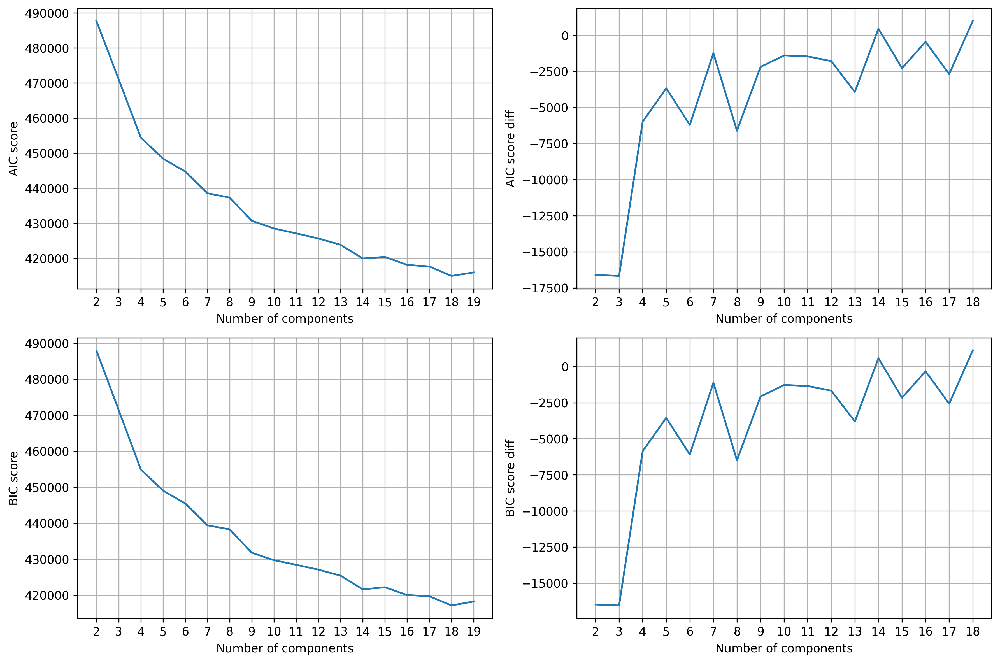

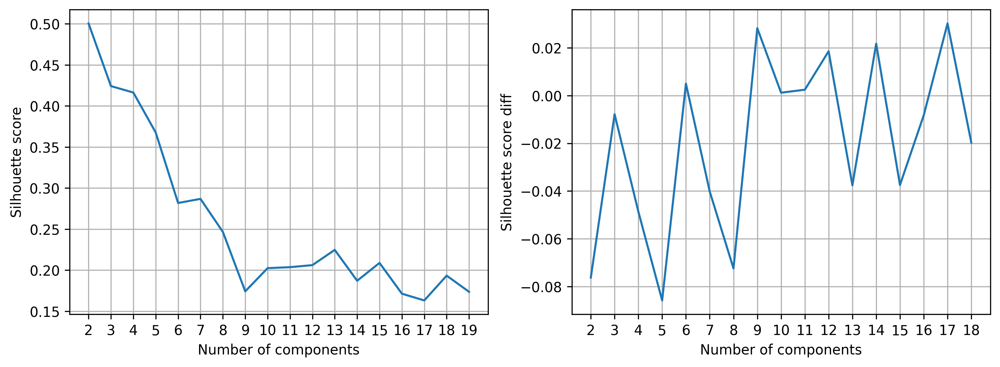

In [67]:
aic_bic_curve(temp_san_score_750_latlonT_5_60_95, max_components=20)
silhouette_score_curve(temp_san_score_750_latlonT_5_60_95, max_components=20)

# 4. Sensitivity test, using different training data

## 750 data, lat_step=5, lon_step=50

shape of the scaled temperature: (23652, 148)
shape of the EOFs for temperature: (148, 2)
variation explained by PC1 and PC2 for temperature: [0.49120363 0.3686495 ]
variation explained by PC1 and PC2 for salinity: [0.87603338 0.05511192]
shape of the score for temperature: (23652, 2)


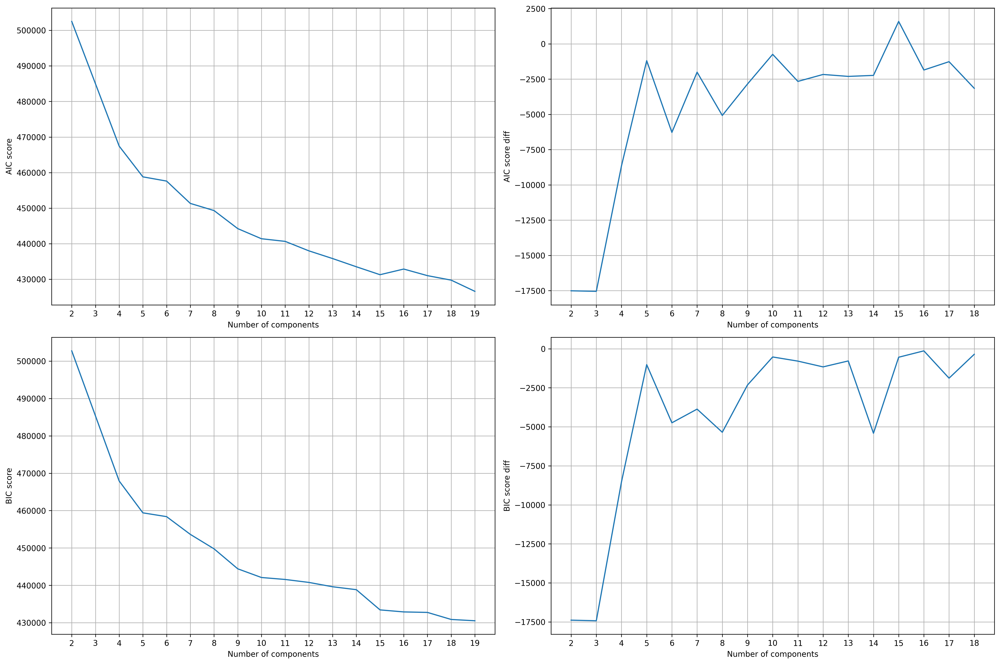

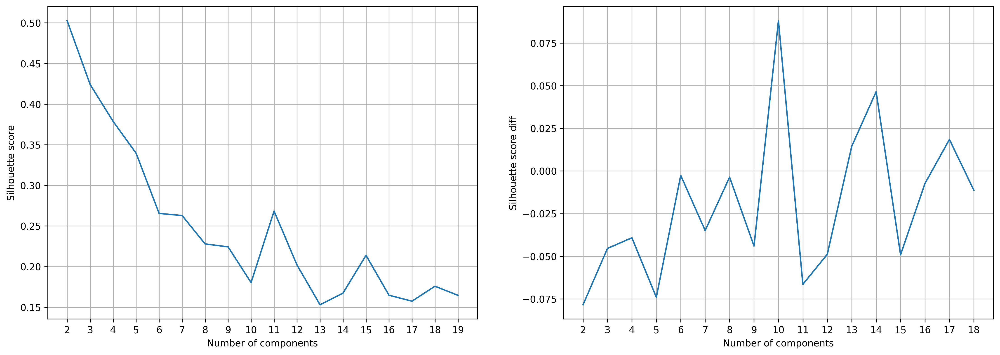

In [54]:
temp_san_score_750_latlonT_5_50_95=pca_score(ds_train_750_latlonT_5_50_95,plot_figs=False)
aic_bic_curve(temp_san_score_750_latlonT_5_50_95, max_components=20)
silhouette_score_curve(temp_san_score_750_latlonT_5_50_95, max_components=20)

## 750 data, lat_step=5, lon_step=70

shape of the scaled temperature: (23916, 148)
shape of the EOFs for temperature: (148, 2)
variation explained by PC1 and PC2 for temperature: [0.49214074 0.36636811]
variation explained by PC1 and PC2 for salinity: [0.87566872 0.05502591]
shape of the score for temperature: (23916, 2)


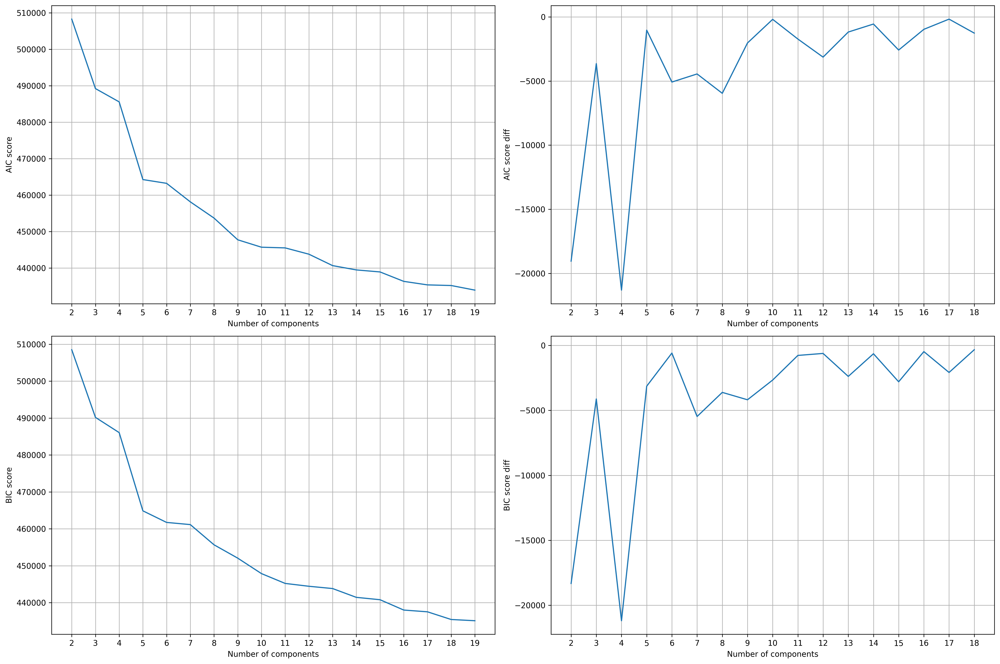

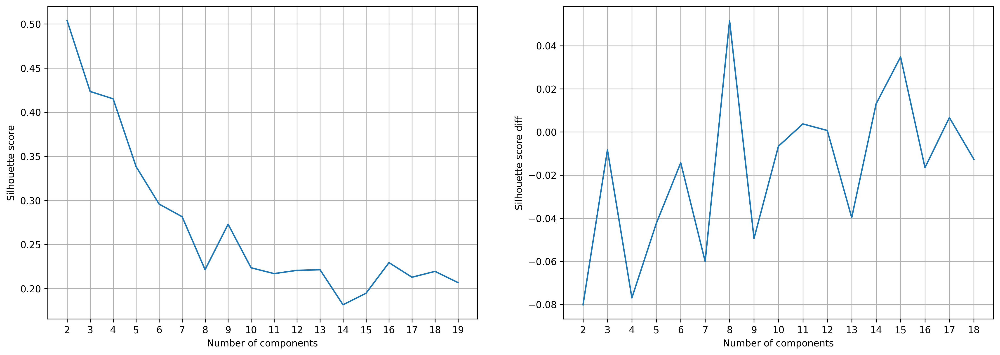

In [55]:
temp_san_score_750_latlonT_5_70_95=pca_score(ds_train_750_latlonT_5_70_95,plot_figs=False)
aic_bic_curve(temp_san_score_750_latlonT_5_70_95, max_components=20)
silhouette_score_curve(temp_san_score_750_latlonT_5_70_95, max_components=20)

## 250 data, lat_step=10, lon_step=20

shape of the scaled temperature: (17928, 148)
shape of the EOFs for temperature: (148, 2)
variation explained by PC1 and PC2 for temperature: [0.47891386 0.36854337]
variation explained by PC1 and PC2 for salinity: [0.85550003 0.07070323]
shape of the score for temperature: (17928, 2)


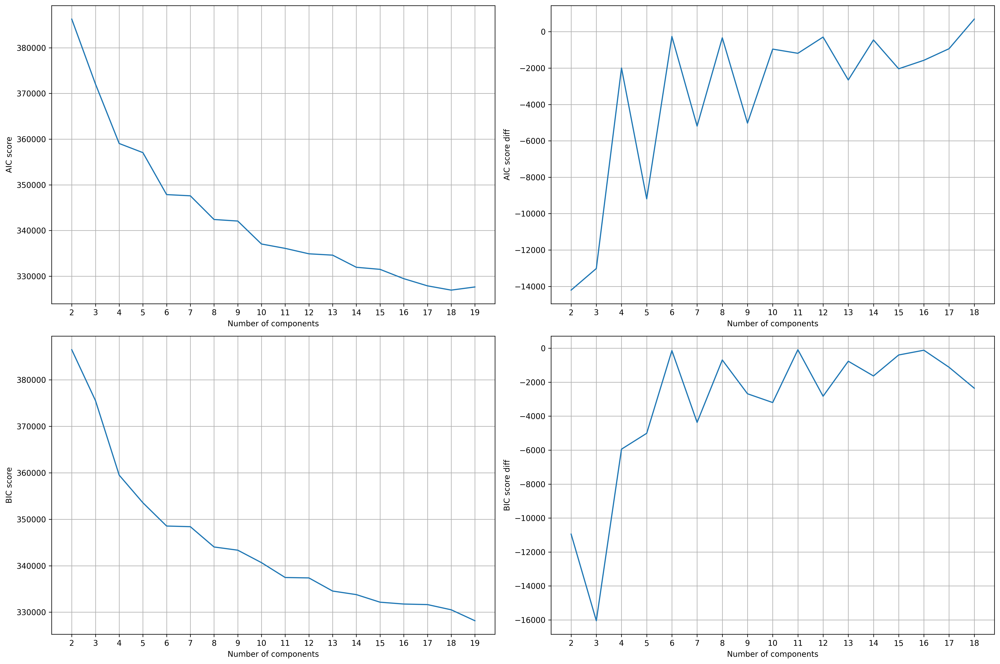

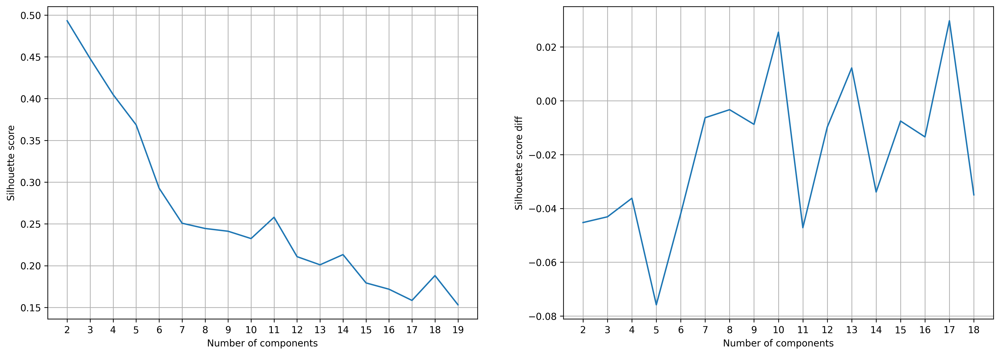

In [56]:
temp_san_score_250_latlonT_10_20_95=pca_score(ds_train_250_latlonT_10_20_95,plot_figs=False)
aic_bic_curve(temp_san_score_250_latlonT_10_20_95, max_components=20)
silhouette_score_curve(temp_san_score_250_latlonT_10_20_95, max_components=20)

## 250 data, lat_step=10, lon_step=10

shape of the scaled temperature: (19140, 148)
shape of the EOFs for temperature: (148, 2)
variation explained by PC1 and PC2 for temperature: [0.47765653 0.37403953]
variation explained by PC1 and PC2 for salinity: [0.86115817 0.06563312]
shape of the score for temperature: (19140, 2)


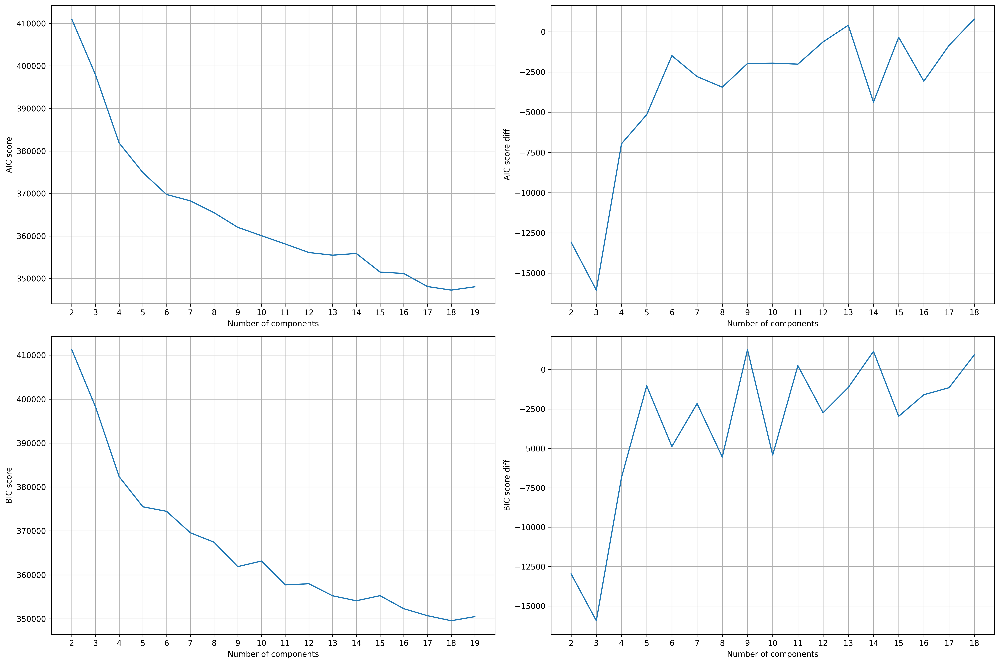

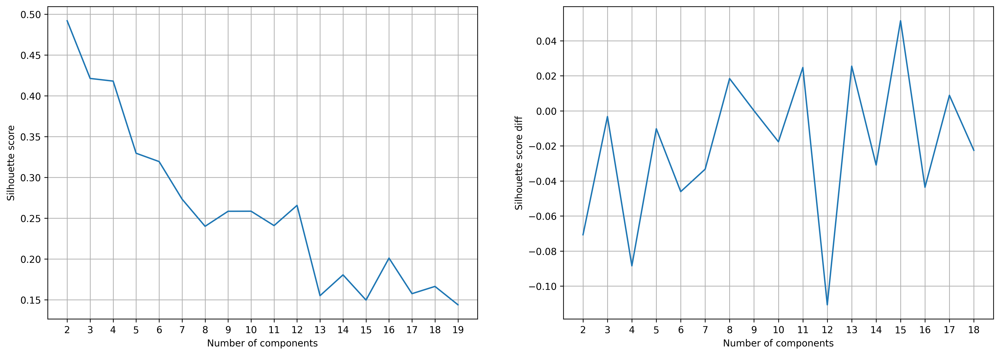

In [57]:
temp_san_score=pca_score(ds_train_250_latlonT_10_10_95,plot_figs=False)
aic_bic_curve(temp_san_score, max_components=20)
silhouette_score_curve(temp_san_score, max_components=20)

## 250 data, lat_step=10, lon_step=30

shape of the scaled temperature: (19596, 148)
shape of the EOFs for temperature: (148, 2)
variation explained by PC1 and PC2 for temperature: [0.4770018  0.37469511]
variation explained by PC1 and PC2 for salinity: [0.86292919 0.06423854]
shape of the score for temperature: (19596, 2)


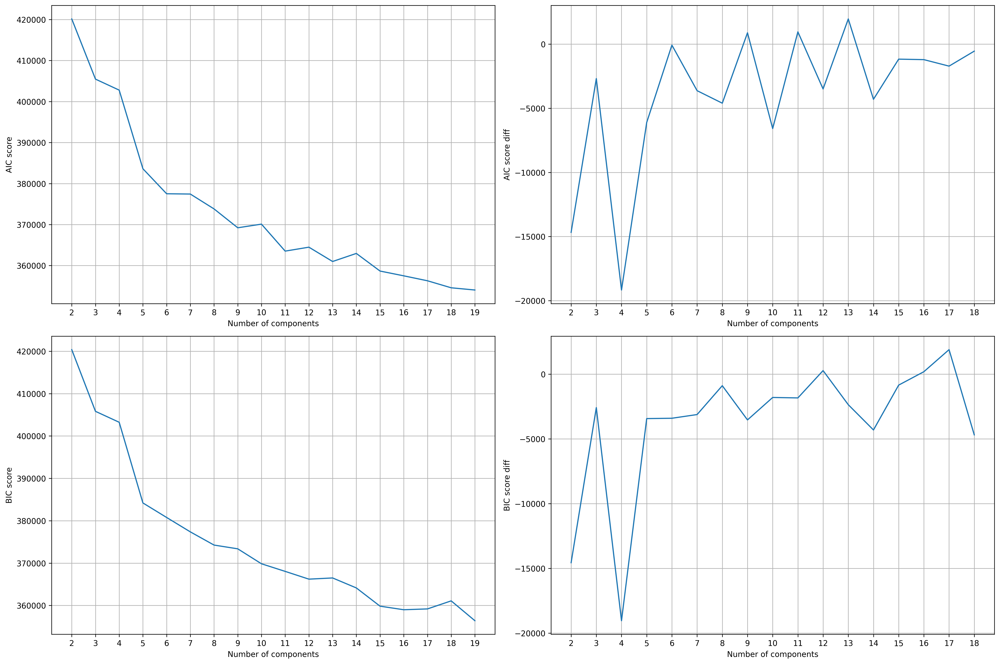

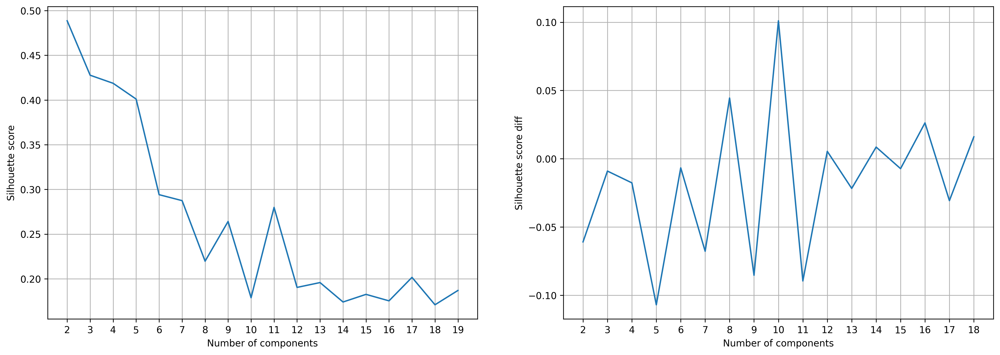

In [58]:
temp_san_score=pca_score(ds_train_250_latlonT_10_30_95,plot_figs=False)
aic_bic_curve(temp_san_score, max_components=20)
silhouette_score_curve(temp_san_score, max_components=20)

In [ ]:


# from sklearn.decomposition import PCA
# from scipy.stats import zscore
# from sklearn.preprocessing import StandardScaler
# import numpy as np
# import pandas as pd

# def pca_score(ds_cleaned, plot_figs=False):
#     # Normalize the data

#     scaler = StandardScaler()
#     temp_scaled = scaler.fit_transform(ds_cleaned['temperature'].values)
#     san_scaled = scaler.fit_transform(ds_cleaned['salinity'].values)
#     print(f'shape of the scaled temperature: {temp_scaled.shape}')

#     n_pc = 2  # number of principal components
#     pca_T = PCA(n_components=n_pc,svd_solver='full')
#     pca_S = PCA(n_components=n_pc)
#     columns = [f'EOF {i}' for i in range(1, n_pc+1)]

#     fitted_temp = pca_T.fit(temp_scaled)
#     EOFs_temp=fitted_temp.components_.T
#     EOFs_temp_df = pd.DataFrame(data=EOFs_temp, columns=columns)
#     print(f'shape of the EOFs for temperature: {EOFs_temp.shape}')

#     # pca for salinity
#     fitted_san = pca_S.fit(san_scaled)
#     EOFs_san=fitted_san.components_.T
#     EOFs_san_df = pd.DataFrame(data=EOFs_san, columns=columns)

#     v_exp_temp = pca_T.explained_variance_ratio_
#     v_exp_san = pca_S.explained_variance_ratio_

#     print(f'variation explained by EOF1 and EOF2 for temperature: {v_exp_temp}')
#     print(f'variation explained by EOF1 and EOF2 for salinity: {v_exp_san}')


#     temp_score = temp_scaled.dot(EOFs_temp)
#     san_score = san_scaled.dot(EOFs_san)

#     print(f'shape of the score for temperature: {temp_score.shape}')

#     if plot_figs:
#         plot_EOFs(EOFs_temp_df, EOFs_san_df, ds_cleaned, v_exp_temp, v_exp_san)
#         plot_score(temp_score, san_score)


#     temp_san_score=np.concatenate((temp_score,san_score),axis=1)
#     # temp_san_score=[]
    
#     return temp_san_score

# ############################################################################################
# # function to plot the pc
# import matplotlib.pyplot as plt

# def plot_EOFs(EOFs_temp_df, EOFs_san_df, ds_cleaned, v_exp_temp, v_exp_san):
#     # Create a figure with two subplots side by side
#     fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5), dpi=300)

#     # Loop through all the PCs and plot them for temperature and salinity
#     for i in range(EOFs_temp_df.shape[1]):
#         # Plot the i-th PC for temperature in the left subplot
#         axes[0].plot(EOFs_temp_df[f'EOF {i+1}'], ds_cleaned['pressure'], label=f'EOF {i+1}, Exp_var:{v_exp_temp[i]:.2f}')
#         # add a grey vertical line at x==0
#         axes[0].axvline(x=0, color='grey', linestyle='--')
#         axes[0].set_title('Temperature')
#         axes[0].set_xlabel('EOF Values')
#         axes[0].set_ylabel('Pressure (dbar)')
#         # axes[0].invert_yaxis()
#         axes[0].legend()

#         # Plot the i-th PC for salinity in the right subplot
#         axes[1].plot(EOFs_san_df[f'EOF {i+1}'], ds_cleaned['pressure'], label=f'EOF {i+1}, Exp_var:{v_exp_san[i]:.2f}')
#         axes[1].axvline(x=0, color='grey', linestyle='--')
#         axes[1].set_title('Salinity')
#         axes[1].set_xlabel('EOF Values')
#         axes[1].set_ylabel('Pressure (dbar)')
#         # axes[1].invert_yaxis()
#         axes[1].legend()

#     # Adjust the spacing between the subplots
#     fig.subplots_adjust(wspace=0.3)

#     # Show the figure
#     plt.show()

# ############################################################################################
# # function to plot the score:
# import matplotlib.pyplot as plt
# import numpy as np

# def plot_score(temp_score, san_score):
#     n_cols = temp_score.shape[1]  # number of principal components
#     fig, axs = plt.subplots(nrows=2, ncols=n_cols, figsize=(12, 8), dpi=300)

#     for i in range(n_cols):
#         axs[0, i].hist(temp_score[:, i], bins=100, density=True)
#         axs[0, i].set_xlim(np.quantile(temp_score, 0.001), np.quantile(temp_score, 0.999))
#         axs[0, i].set_xlabel(f'Temperature score on EOF {i+1}')
#         axs[0, i].set_ylabel('Probability density')
#         #axs[0, i].set_yticklabels([str(int(ytick/len(temp_score))) for ytick in axs[0, i].get_yticks()])  # set ytick labels divided by 2

#         axs[1, i].hist(san_score[:, i], bins=100, density=True)
#         axs[1, i].set_xlim(np.quantile(san_score, 0.001), np.quantile(san_score, 0.999))
#         axs[1, i].set_xlabel(f'Salinity score on EOF {i+1}')
#         axs[1, i].set_ylabel('Probability density')
#         # axs[1, i].set_yticklabels([str(int(ytick/len(temp_score))) for ytick in axs[1, i].get_yticks()])  # set ytick labels divided by 2

#     plt.tight_layout()
#     plt.show()


In [ ]:
# from sklearn.mixture import GaussianMixture
# import numpy as np
# import matplotlib.pyplot as plt

# def aic_bic_curve(temp_san_score, max_components=20):
#     aic = []
#     for i in range(2, max_components):
#         gmm_model = GaussianMixture(n_components=i, covariance_type='full')
#         gmm_model.fit(temp_san_score)
#         aic.append(gmm_model.aic(temp_san_score))

#     bic = []
#     for i in range(2, max_components):
#         gmm_model = GaussianMixture(n_components=i, covariance_type='full')
#         gmm_model.fit(temp_san_score)
#         bic.append(gmm_model.bic(temp_san_score))

#     # calculate the gradient of bic
#     bic_grad = np.diff(bic)
#     aic_grad = np.diff(aic)

#     # plot bic and bic_grad vs n_components side by side
#     plt.figure(figsize=(12, 8), dpi=300)

#     plt.subplot(2, 2, 1)
#     plt.plot(range(2, max_components), aic)
#     # set xticks to be integers
#     plt.xticks(range(2, max_components))
#     plt.xlabel('Number of components')
#     plt.ylabel('AIC score')
#     plt.grid()

#     plt.subplot(2, 2, 2)
#     plt.plot(range(2, max_components-1), aic_grad)
#     # set xticks to be integers
#     plt.xticks(range(2, max_components-1))
#     plt.xlabel('Number of components')
#     plt.ylabel('AIC score diff')
#     plt.grid()

#     plt.subplot(2, 2, 3)
#     plt.plot(range(2, max_components), bic)
#     # set xticks to be integers
#     plt.xticks(range(2, max_components))
#     plt.xlabel('Number of components')
#     plt.ylabel('BIC score')
#     plt.grid()

#     plt.subplot(2, 2, 4)
#     plt.plot(range(2, max_components-1), bic_grad)
#     # set xticks to be integers
#     plt.xticks(range(2, max_components-1))
#     plt.xlabel('Number of components')
#     plt.ylabel('BIC score diff')
#     # add grid
#     plt.grid()

#     plt.tight_layout()
#     plt.show()


# ########################################################################################################
# '''
# Claculate the silhouette score for GMM, when GMM is created using number of classes from 2 to max_components=20
# '''
# from sklearn.metrics import silhouette_score
# import numpy as np

# def silhouette_score_curve(temp_san_score, max_components=20):
#     silhouette_scores = []
#     for i in range(2, max_components):
#         gmm_model = GaussianMixture(n_components=i, covariance_type='full')
#         gmm_model.fit(temp_san_score)
#         labels = gmm_model.predict(temp_san_score)
#         silhouette_scores.append(silhouette_score(temp_san_score, labels))

#     # calculate the gradient of silhouette_scores
#     silhouette_scores_grad = np.diff(silhouette_scores)

#     # plot silhouette_scores and silhouette_scores_grad vs n_components side by side
#     plt.figure(figsize=(12, 4), dpi=300)

#     plt.subplot(1, 2, 1)
#     plt.plot(range(2, max_components), silhouette_scores)
#     # set xticks to be integers
#     plt.xticks(range(2, max_components))
#     plt.xlabel('Number of components')
#     plt.ylabel('Silhouette score')
#     plt.grid()

#     plt.subplot(1, 2, 2)
#     plt.plot(range(2, max_components-1), silhouette_scores_grad)
#     # set xticks to be integers
#     plt.xticks(range(2, max_components-1))
#     plt.xlabel('Number of components')
#     plt.ylabel('Silhouette score diff')
#     plt.grid()


#     plt.show()

In [5]:
# function to plot the pc
import matplotlib.pyplot as plt

def plot_pc(pca_temp_df, pca_san_df, ds_cleaned, v_exp_temp, v_exp_san):
    # Create a figure with two subplots side by side
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5), dpi=300)

    # Loop through all the PCs and plot them for temperature and salinity
    for i in range(pca_temp_df.shape[1]):
        # Plot the i-th PC for temperature in the left subplot
        axes[0].plot(pca_temp_df[f'pc {i+1}'], ds_cleaned['pressure'], label=f'PC {i+1}, v:{v_exp_temp[i]:.2f}')
        axes[0].set_title('Temperature')
        axes[0].set_xlabel('PC Values')
        axes[0].set_ylabel('Pressure (dbar)')
        # axes[0].invert_yaxis()
        axes[0].legend()

        # Plot the i-th PC for salinity in the right subplot
        axes[1].plot(pca_san_df[f'pc {i+1}'], ds_cleaned['pressure'], label=f'PC {i+1}, v:{v_exp_san[i]:.2f}')
        axes[1].set_title('Salinity')
        axes[1].set_xlabel('PC Values')
        axes[1].set_ylabel('Pressure (dbar)')
        # axes[1].invert_yaxis()
        axes[1].legend()

    # Adjust the spacing between the subplots
    fig.subplots_adjust(wspace=0.3)

    # Show the figure
    plt.show()

########################################################################################################



# function to plot the score:
import matplotlib.pyplot as plt
import numpy as np

def plot_score(temp_score, san_score):
    n_cols = temp_score.shape[1]  # number of principal components
    fig, axs = plt.subplots(nrows=2, ncols=n_cols, figsize=(15, 8), dpi=300)

    for i in range(n_cols):
        axs[0, i].hist(temp_score[:, i], bins=100, density=True)
        axs[0, i].set_xlim(np.quantile(temp_score, 0.001), np.quantile(temp_score, 0.999))
        axs[0, i].set_title(f'PC{i+1}')
        axs[0, i].set_xlabel('Temperature score')
        axs[0, i].set_ylabel('Probability density')
        #axs[0, i].set_yticklabels([str(int(ytick/len(temp_score))) for ytick in axs[0, i].get_yticks()])  # set ytick labels divided by 2

        axs[1, i].hist(san_score[:, i], bins=100, density=True)
        axs[1, i].set_xlim(np.quantile(san_score, 0.001), np.quantile(san_score, 0.999))
        axs[1, i].set_title(f'PC{i+1}')
        axs[1, i].set_xlabel('Salinity score')
        axs[1, i].set_ylabel('Probability density')
        # axs[1, i].set_yticklabels([str(int(ytick/len(temp_score))) for ytick in axs[1, i].get_yticks()])  # set ytick labels divided by 2

    plt.tight_layout()
    plt.show()


########################################################################################################

from sklearn.decomposition import PCA
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd

def pca_score(ds_cleaned):
    # Normalize the data
    scaler = StandardScaler()
    temp_scaled = scaler.fit_transform(ds_cleaned['temperature'].values)
    san_scaled = scaler.fit_transform(ds_cleaned['salinity'].values)

    n_pc = 2  # number of principal components
    pca_T = PCA(n_components=n_pc)
    pca_S = PCA(n_components=n_pc)
    columns = [f'pc {i}' for i in range(1, n_pc+1)]

    pca_temp = pca_T.fit_transform(temp_scaled.T)
    pca_temp_df = pd.DataFrame(data=pca_temp, columns=columns)

    # pca for salinity
    pca_san = pca_S.fit_transform(san_scaled.T)
    pca_san_df = pd.DataFrame(data=pca_san, columns=columns)

    temp_score = temp_scaled.dot(zscore(pca_temp))
    san_score = san_scaled.dot(zscore(pca_san))

    v_exp_temp = pca_T.explained_variance_ratio_
    v_exp_san = pca_S.explained_variance_ratio_

    print(f'variation explained by PC1 and PC2 for temperature: {v_exp_temp}')
    print(f'variation explained by PC1 and PC2 for salinity: {v_exp_san}')

    plot_pc(pca_temp_df, pca_san_df, ds_cleaned, v_exp_temp, v_exp_san)
    plot_score(temp_score, san_score)

    temp_san_score=np.concatenate((temp_score,san_score),axis=1)
    
    return temp_san_score

In [15]:
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt

def aic_bic_curve(temp_san_score, max_components=20):
    aic = []
    for i in range(2, max_components):
        gmm_model = GaussianMixture(n_components=i, covariance_type='full')
        gmm_model.fit(temp_san_score)
        aic.append(gmm_model.aic(temp_san_score))

    bic = []
    for i in range(2, max_components):
        gmm_model = GaussianMixture(n_components=i, covariance_type='full')
        gmm_model.fit(temp_san_score)
        bic.append(gmm_model.bic(temp_san_score))

    # calculate the gradient of bic
    bic_grad = np.diff(bic)
    aic_grad = np.diff(aic)

    # plot bic and bic_grad vs n_components side by side
    plt.figure(figsize=(18, 12), dpi=300)

    plt.subplot(2, 2, 1)
    plt.plot(range(2, max_components), aic)
    # set xticks to be integers
    plt.xticks(range(2, max_components))
    plt.xlabel('Number of components')
    plt.ylabel('AIC score')
    plt.grid()

    plt.subplot(2, 2, 2)
    plt.plot(range(2, max_components-1), aic_grad)
    # set xticks to be integers
    plt.xticks(range(2, max_components-1))
    plt.xlabel('Number of components')
    plt.ylabel('AIC score diff')
    plt.grid()

    plt.subplot(2, 2, 3)
    plt.plot(range(2, max_components), bic)
    # set xticks to be integers
    plt.xticks(range(2, max_components))
    plt.xlabel('Number of components')
    plt.ylabel('BIC score')
    plt.grid()

    plt.subplot(2, 2, 4)
    plt.plot(range(2, max_components-1), bic_grad)
    # set xticks to be integers
    plt.xticks(range(2, max_components-1))
    plt.xlabel('Number of components')
    plt.ylabel('BIC score diff')
    # add grid
    plt.grid()

    plt.tight_layout()
    plt.show()


########################################################################################################
'''
Claculate the silhouette score for GMM, when GMM is created using number of classes from 2 to max_components=20
'''
from sklearn.metrics import silhouette_score
import numpy as np

def silhouette_score_curve(temp_san_score, max_components=20):
    silhouette_scores = []
    for i in range(2, max_components):
        gmm_model = GaussianMixture(n_components=i, covariance_type='full')
        gmm_model.fit(temp_san_score)
        labels = gmm_model.predict(temp_san_score)
        silhouette_scores.append(silhouette_score(temp_san_score, labels))

    # calculate the gradient of silhouette_scores
    silhouette_scores_grad = np.diff(silhouette_scores)

    # plot silhouette_scores and silhouette_scores_grad vs n_components side by side
    plt.figure(figsize=(18, 6), dpi=300)

    plt.subplot(1, 2, 1)
    plt.plot(range(2, max_components), silhouette_scores)
    # set xticks to be integers
    plt.xticks(range(2, max_components))
    plt.xlabel('Number of components')
    plt.ylabel('Silhouette score')
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.plot(range(2, max_components-1), silhouette_scores_grad)
    # set xticks to be integers
    plt.xticks(range(2, max_components-1))
    plt.xlabel('Number of components')
    plt.ylabel('Silhouette score diff')
    plt.grid()


    plt.show()


Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1913
threshold=4807, training dataset size=22956
variation explained by PC1 and PC2 for temperature: [0.68128683 0.17280066]
variation explained by PC1 and PC2 for salinity: [0.43954955 0.24460903]


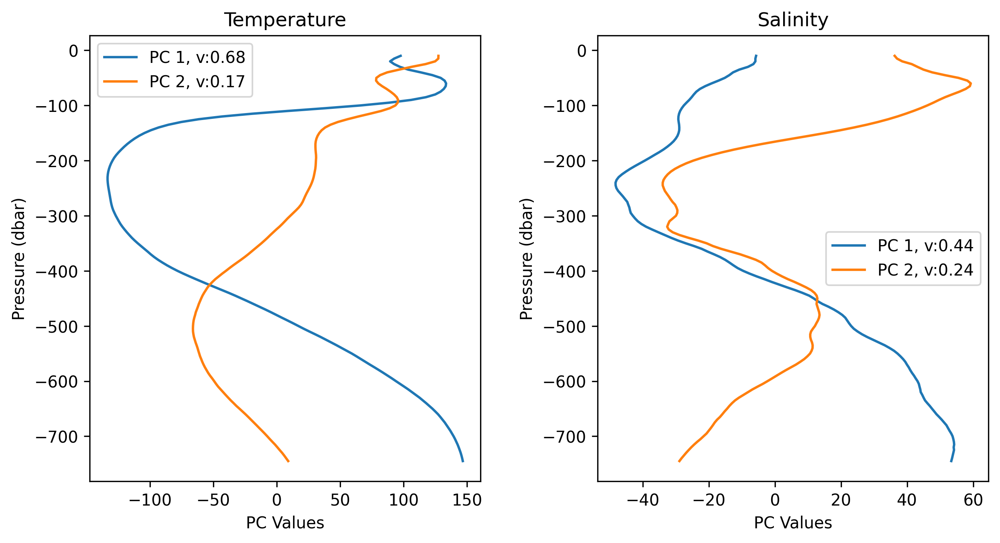

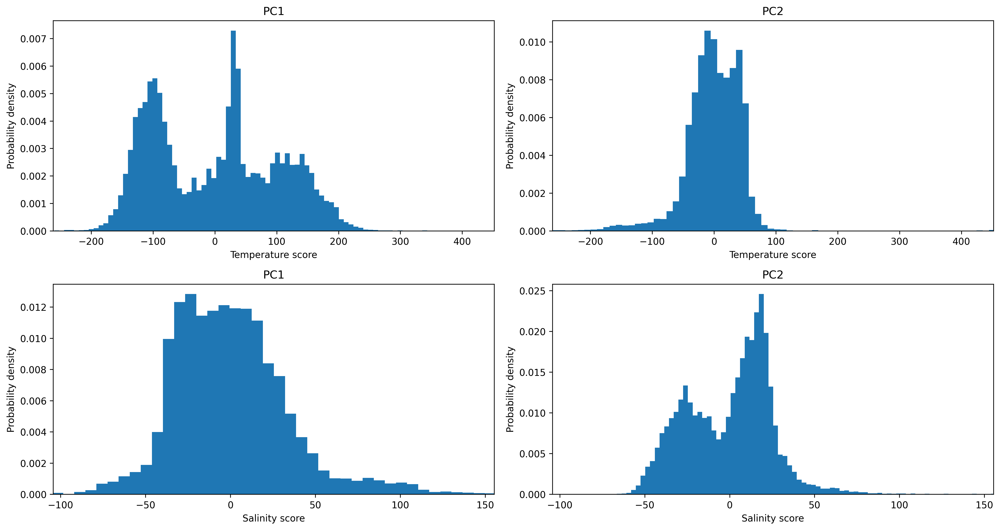

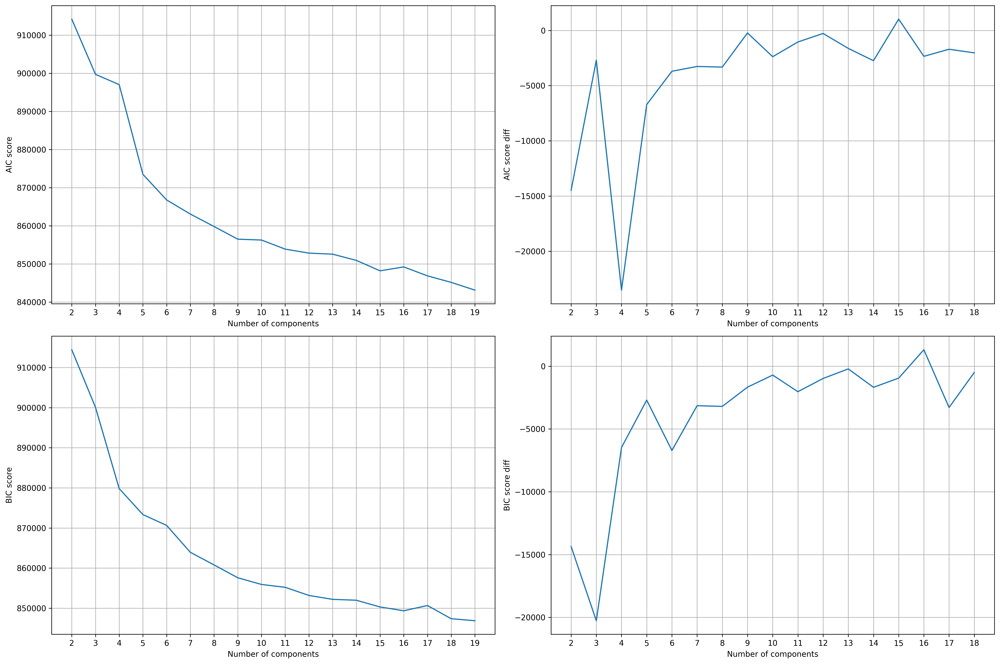

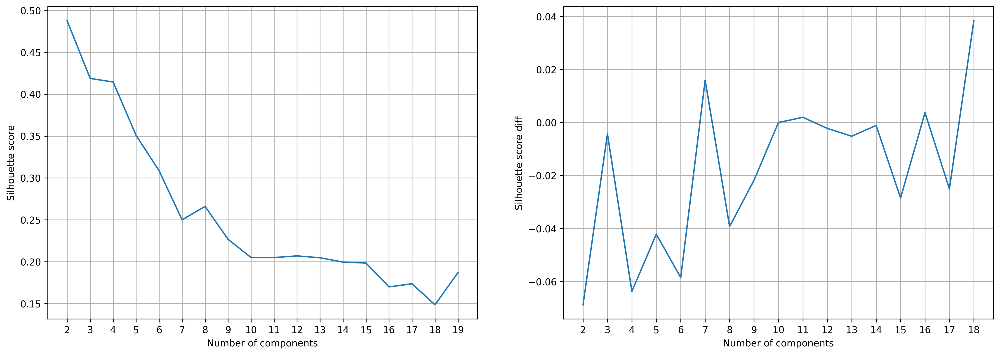

In [16]:
import prepare_training_data_functions as ptd

ds_train_750_latlonT_5_60_95=ptd.prepare_training_data(5,60,0.95,ds_cleaned_750)
temp_san_score_750_latlonT_5_60_95=pca_score(ds_train_750_latlonT_5_60_95)

aic_bic_curve(temp_san_score_750_latlonT_5_60_95, max_components=20)
silhouette_score_curve(temp_san_score_750_latlonT_5_60_95, max_components=20)

No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1971
threshold=4770, training dataset size=23652
variation explained by PC1 and PC2 for temperature: [0.68330975 0.17023994]
variation explained by PC1 and PC2 for salinity: [0.44194146 0.24323262]


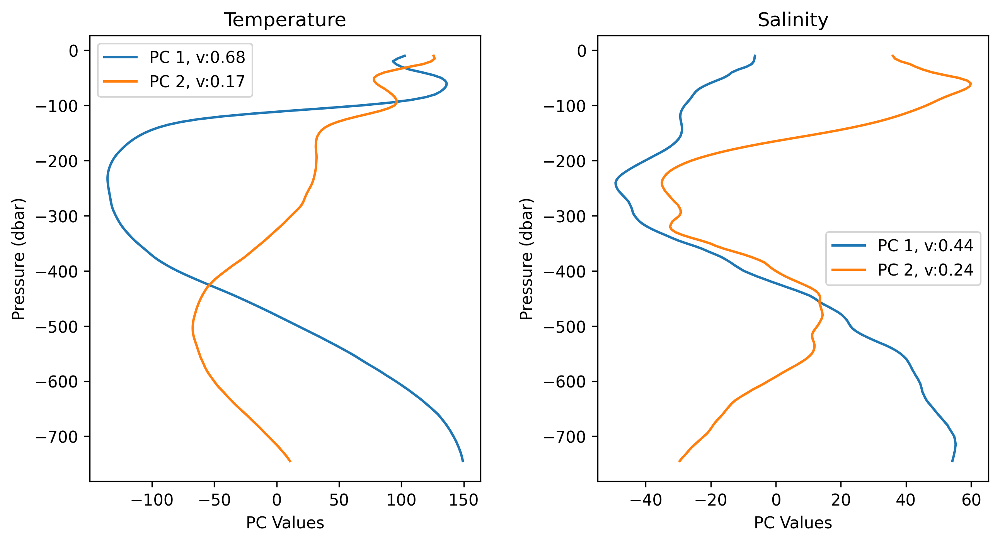

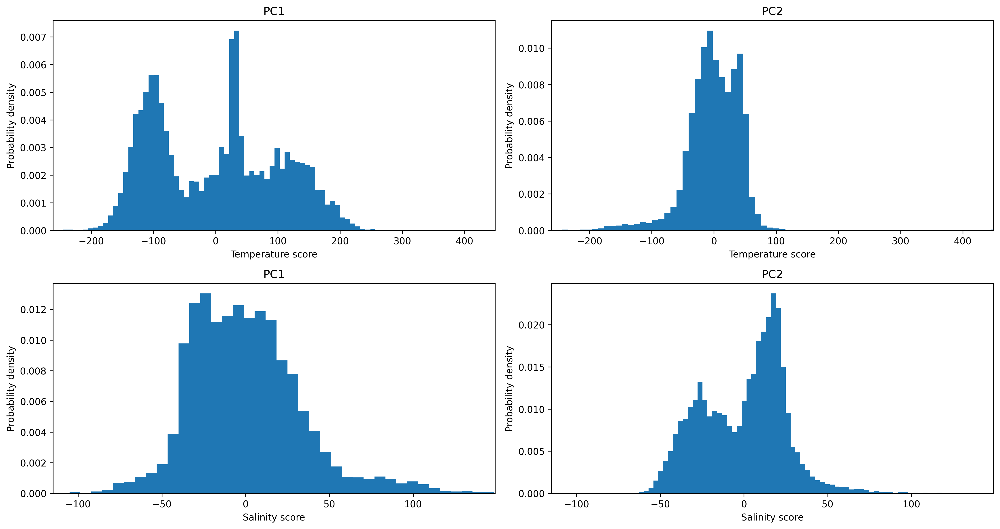

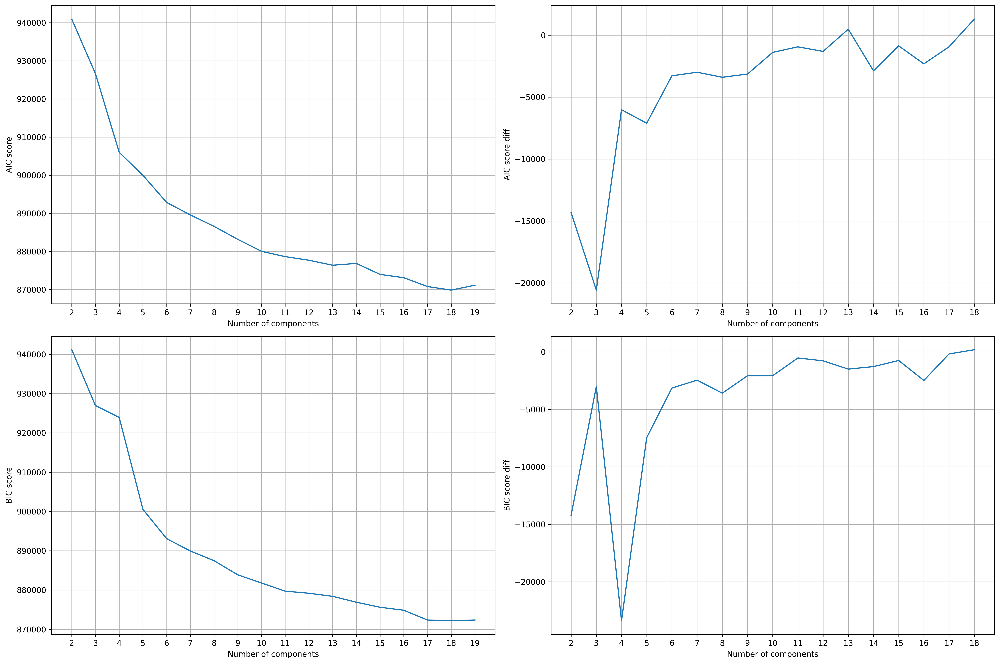

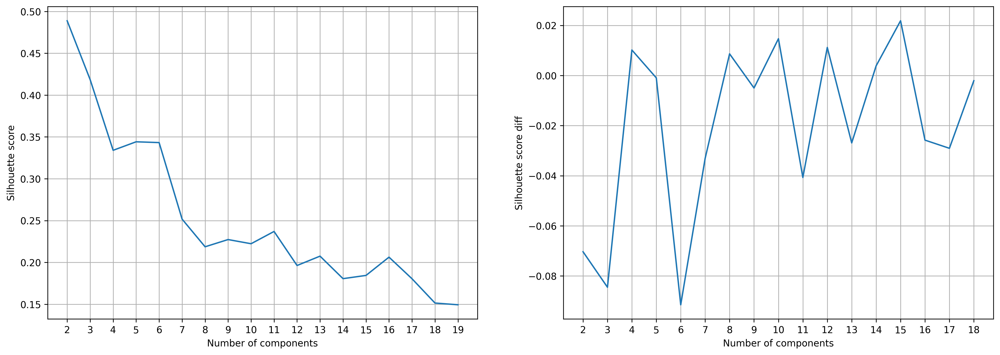

In [17]:
ds_train_750_latlonT_5_50_95=ptd.prepare_training_data(5,50,0.95,ds_cleaned_750)
temp_san_score_750_latlonT_5_50_95=pca_score(ds_train_750_latlonT_5_50_95)
aic_bic_curve(temp_san_score_750_latlonT_5_50_95, max_components=20)
silhouette_score_curve(temp_san_score_750_latlonT_5_50_95, max_components=20)

No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
No data points for group (nan, Interval(75, 80, closed='right'))
No data points for group (nan, Interval(80, 85, closed='right'))
No data points for group (nan, Interval(85, 90, closed='right'))
Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1993
threshold=5746, training dataset size=23916
variation explained by PC1 and PC2 for temperature: [0.68339828 0.16939793]
variation explained by PC1 and PC2 for salinity: [0.44007947 0.24468849]


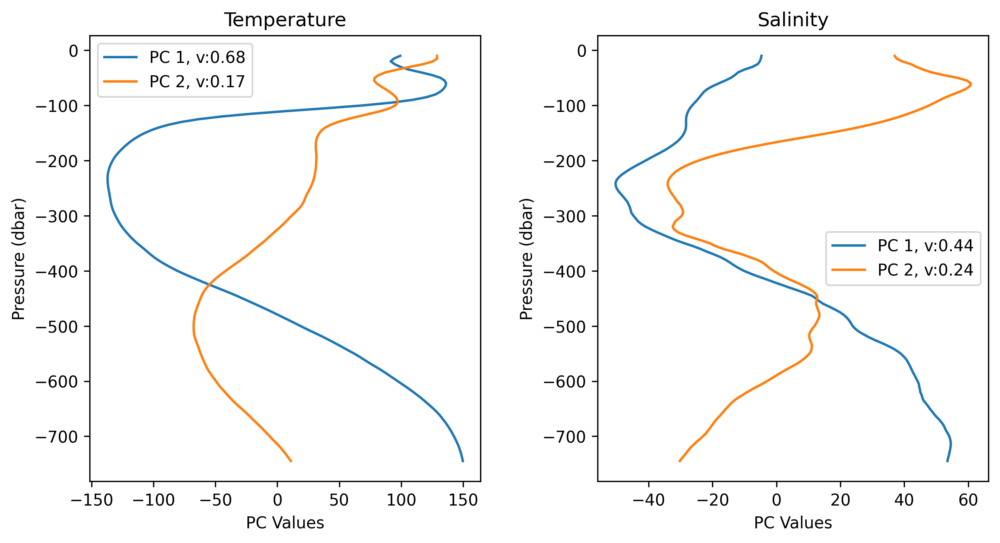

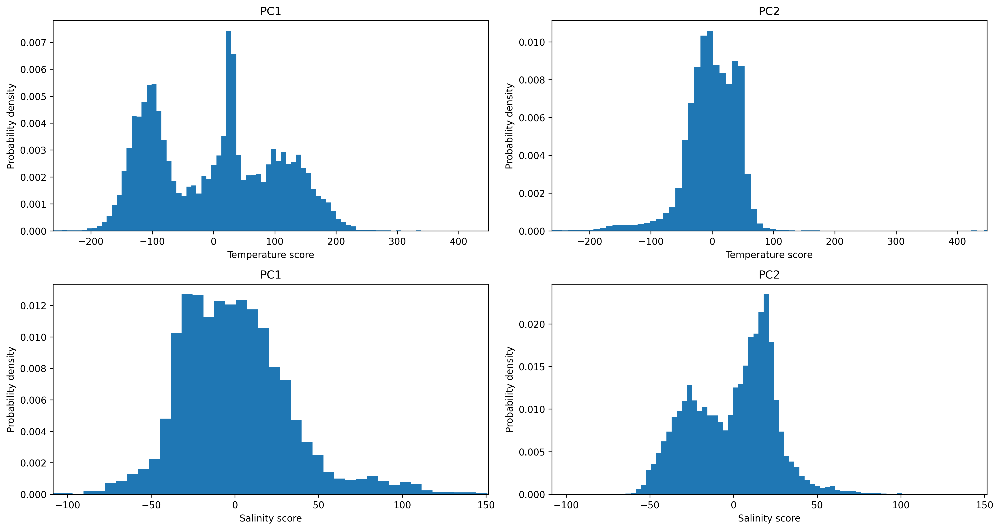

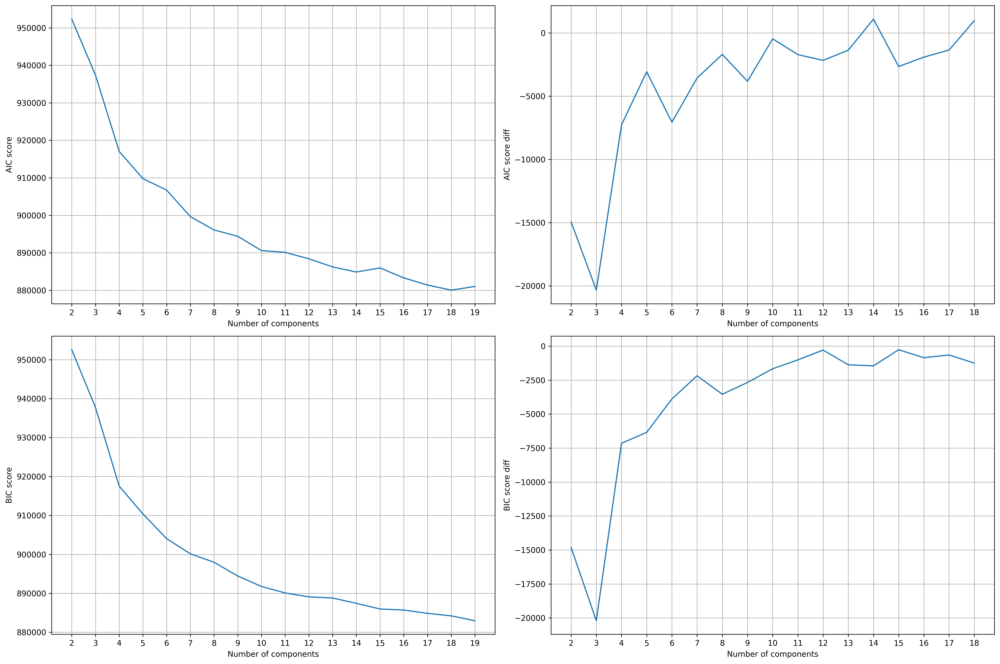

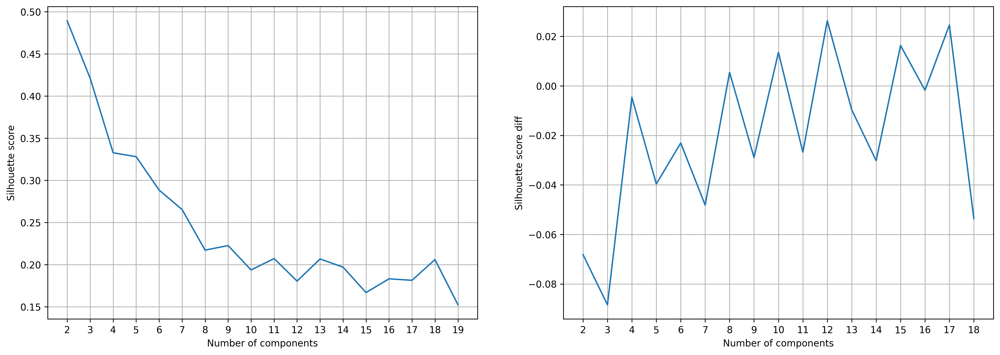

In [20]:
ds_train_750_latlonT_5_70_95=ptd.prepare_training_data(5,70,0.95,ds_cleaned_750)
temp_san_score_750_latlonT_5_70_95=pca_score(ds_train_750_latlonT_5_70_95)
aic_bic_curve(temp_san_score_750_latlonT_5_70_95, max_components=20)
silhouette_score_curve(temp_san_score_750_latlonT_5_70_95, max_components=20)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1494
threshold=2591, training dataset size=17928
variation explained by PC1 and PC2 for temperature: [0.64927388 0.19979868]
variation explained by PC1 and PC2 for salinity: [0.48567896 0.21671668]


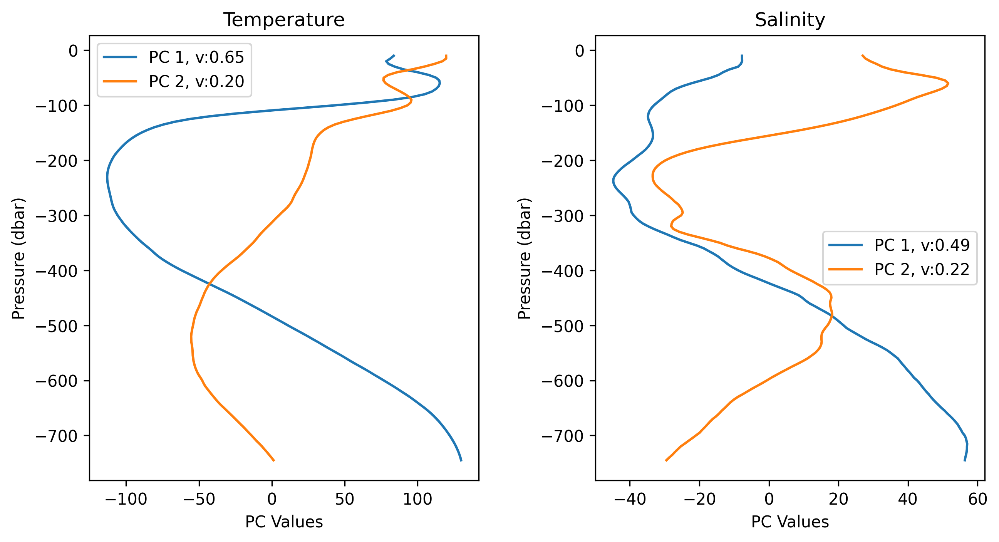

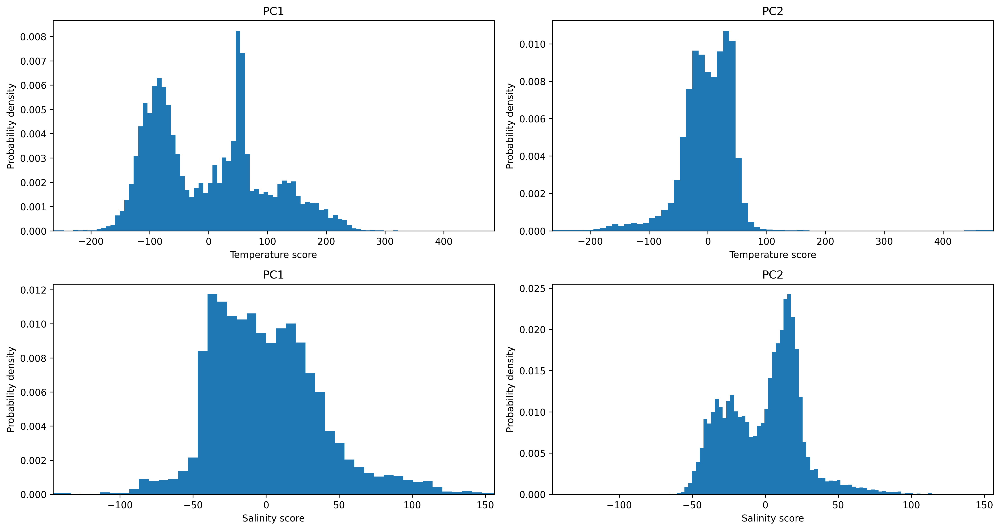

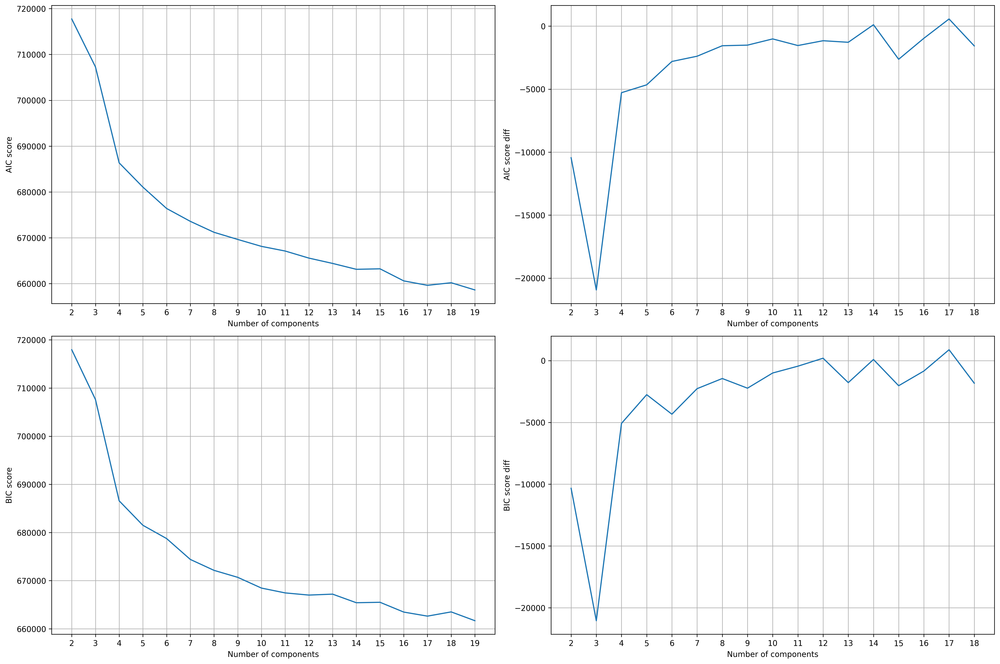

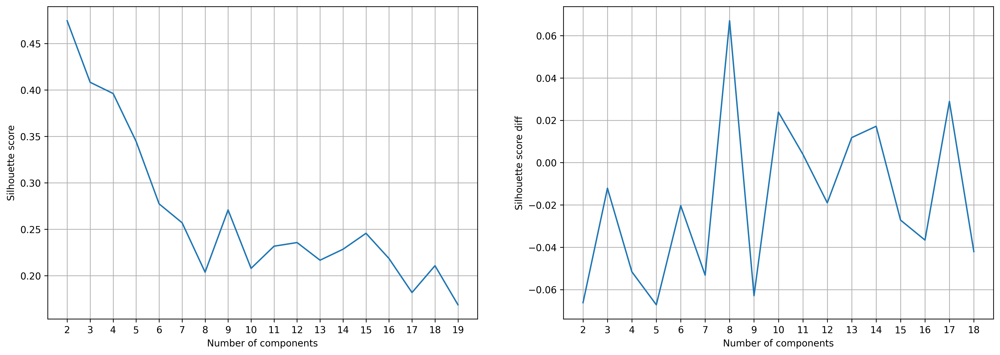

In [18]:
ds_train_250_latlonT_10_20_95=ptd.prepare_training_data(10,20,0.95,ds_cleaned_750)
temp_san_score_250_latlonT_10_20_95=pca_score(ds_train_250_latlonT_10_20_95)
aic_bic_curve(temp_san_score_250_latlonT_10_20_95, max_components=20)
silhouette_score_curve(temp_san_score_250_latlonT_10_20_95, max_components=20)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1595
threshold=1954, training dataset size=19140
variation explained by PC1 and PC2 for temperature: [0.66508764 0.18601282]
variation explained by PC1 and PC2 for salinity: [0.46939438 0.22875654]


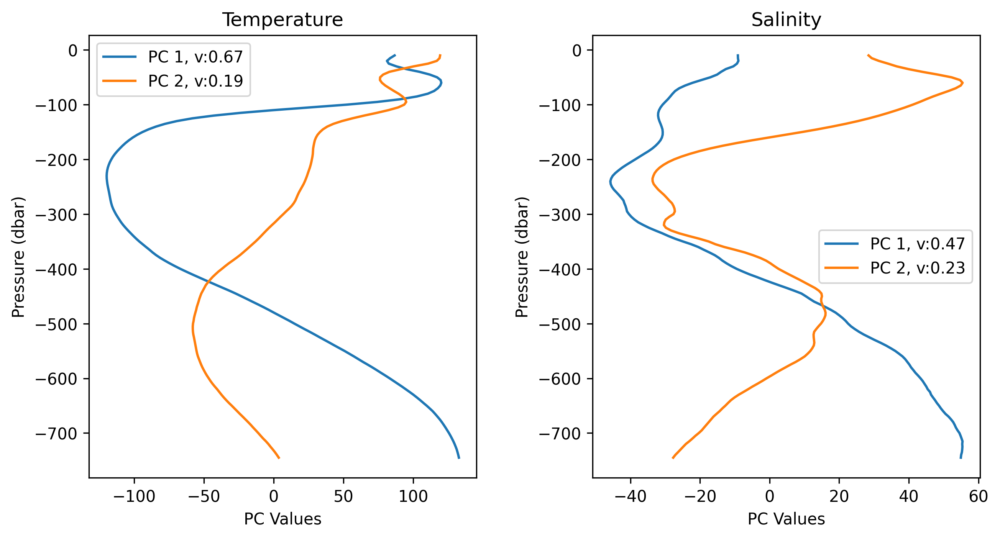

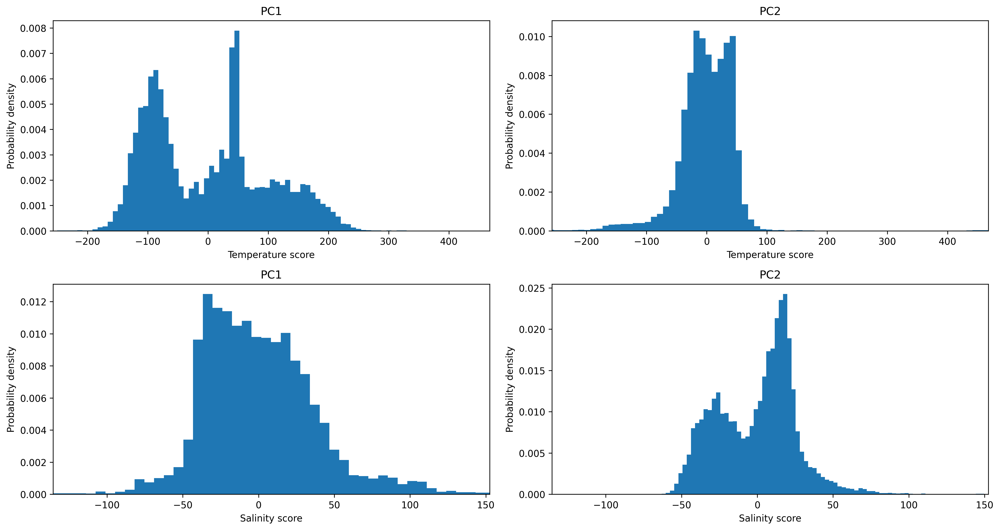

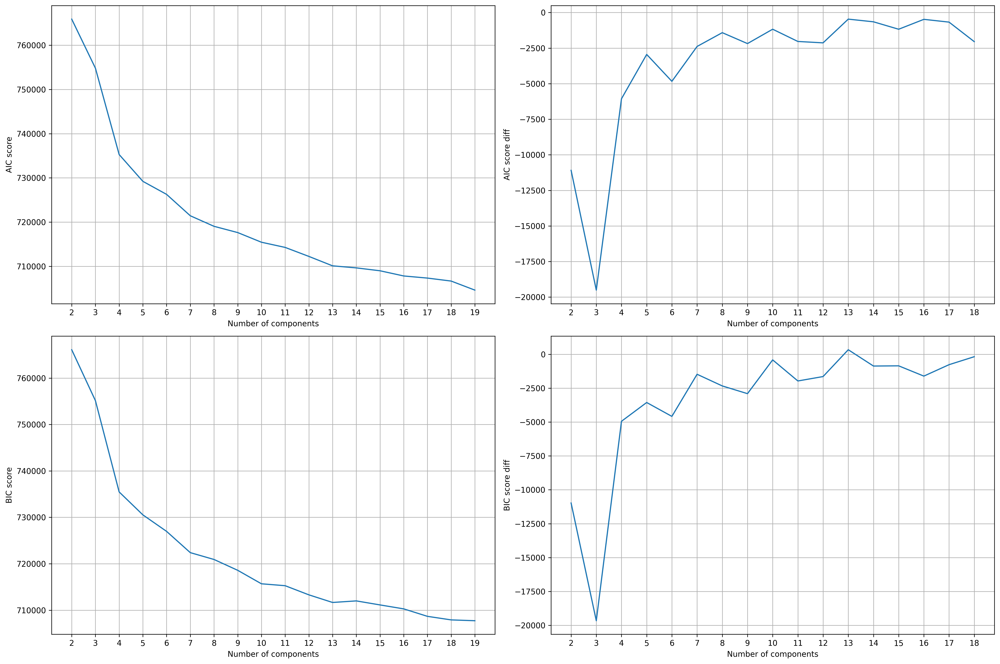

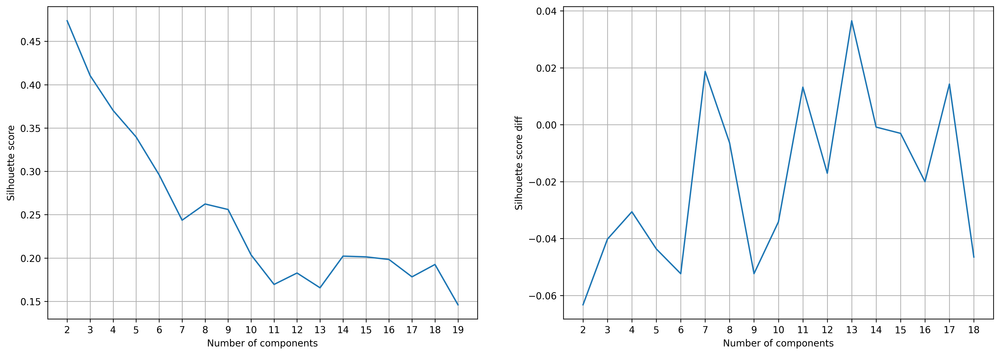

In [21]:
ds_train_250_latlonT_10_10_95=ptd.prepare_training_data(10,10,0.95,ds_cleaned_750)
temp_san_score_250_latlonT_10_10_95=pca_score(ds_train_250_latlonT_10_10_95)
aic_bic_curve(temp_san_score_250_latlonT_10_10_95, max_components=20)
silhouette_score_curve(temp_san_score_250_latlonT_10_10_95, max_components=20)

Ratio is too large, selected_size_monthly is reset to the smallest_month_size: 1633
threshold=4020, training dataset size=19596
variation explained by PC1 and PC2 for temperature: [0.66789247 0.18227274]
variation explained by PC1 and PC2 for salinity: [0.46541037 0.23306997]


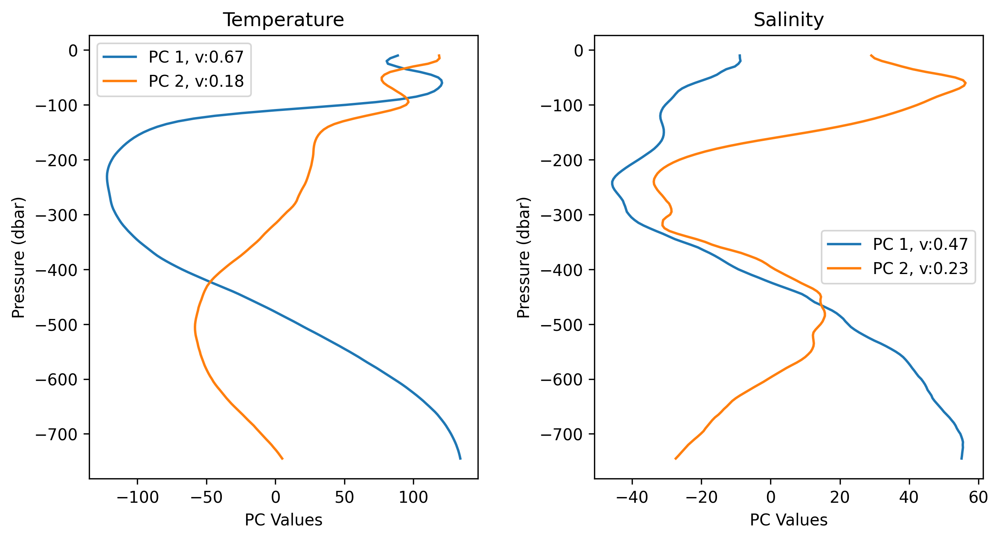

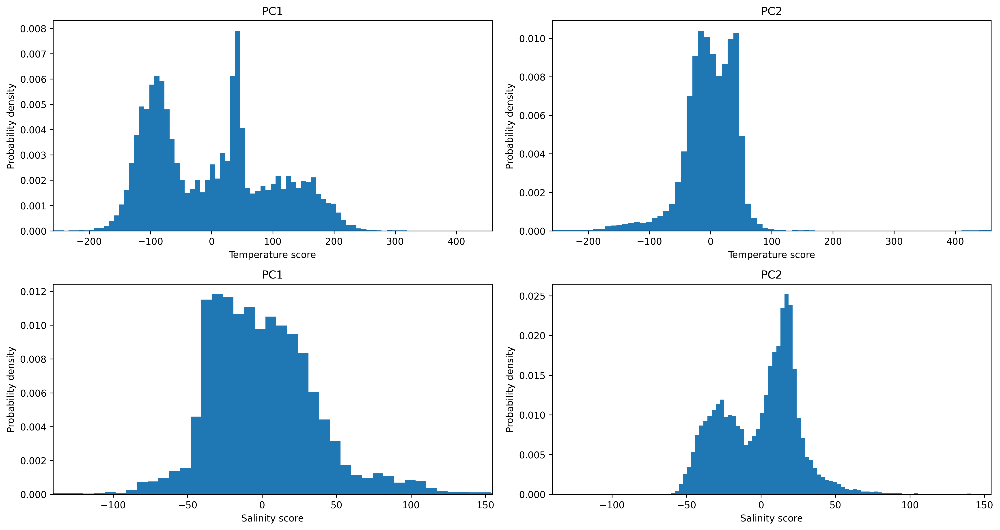

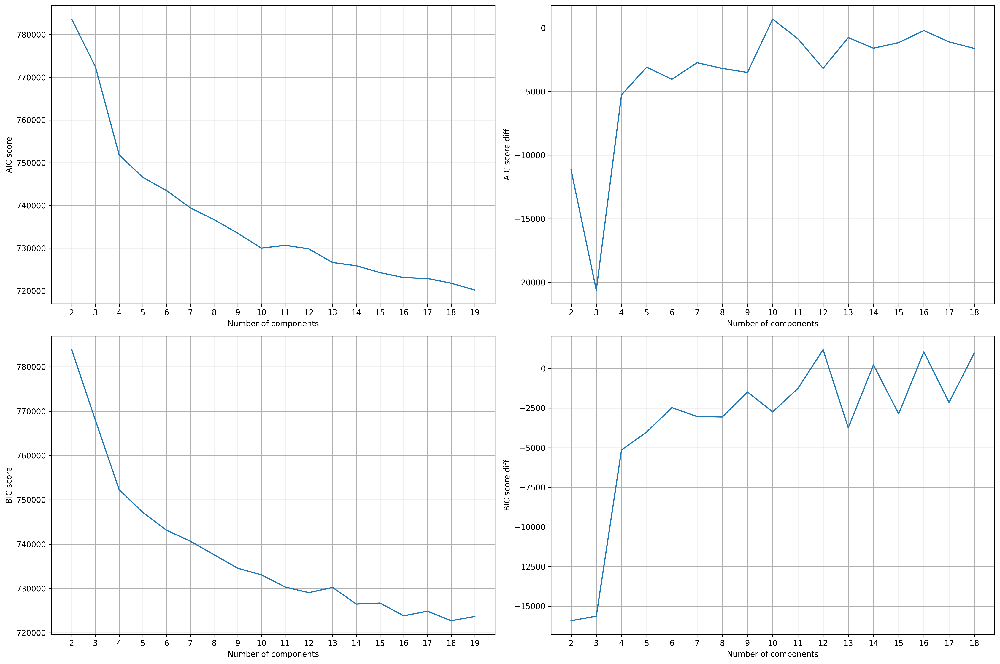

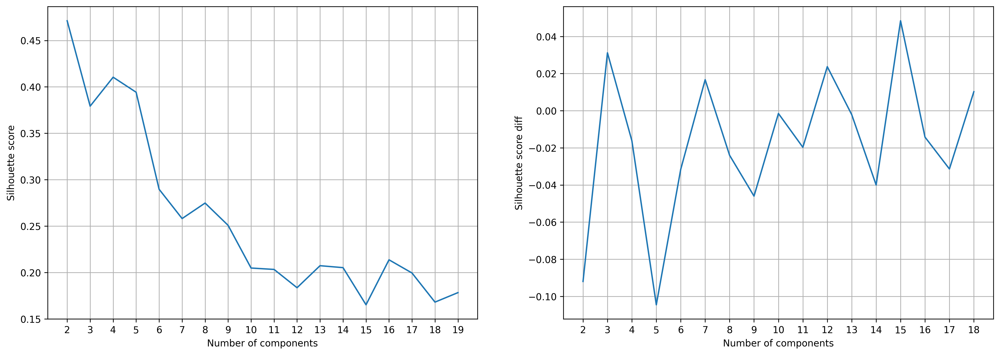

In [19]:
ds_train_250_latlonT_10_30_95=ptd.prepare_training_data(10,30,0.95,ds_cleaned_750)
temp_san_score_250_latlonT_10_30_95=pca_score(ds_train_250_latlonT_10_30_95)
aic_bic_curve(temp_san_score_250_latlonT_10_30_95, max_components=20)
silhouette_score_curve(temp_san_score_250_latlonT_10_30_95, max_components=20)

variation explained by PC1 and PC2 for temperature: [0.68892226 0.15651934]
variation explained by PC1 and PC2 for salinity: [0.44541149 0.23758103]


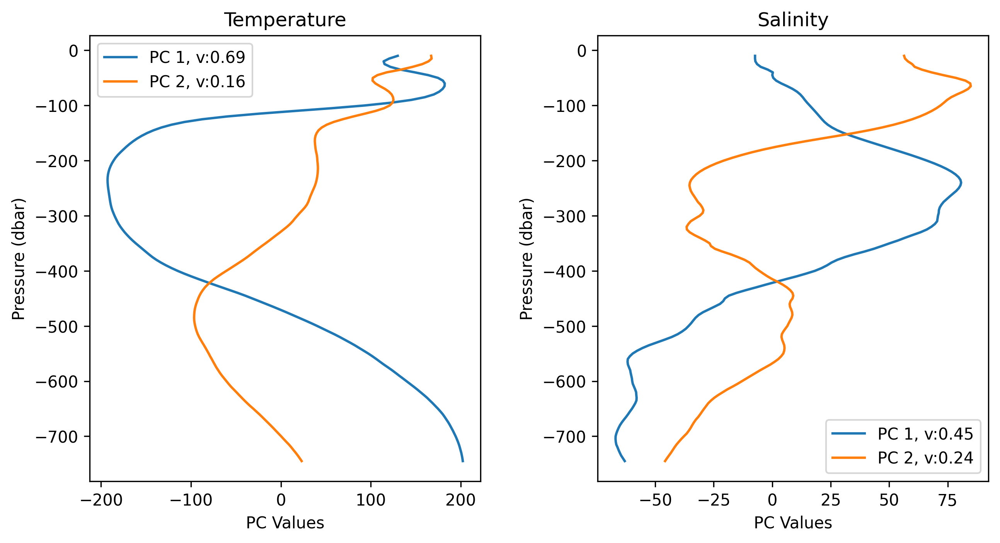

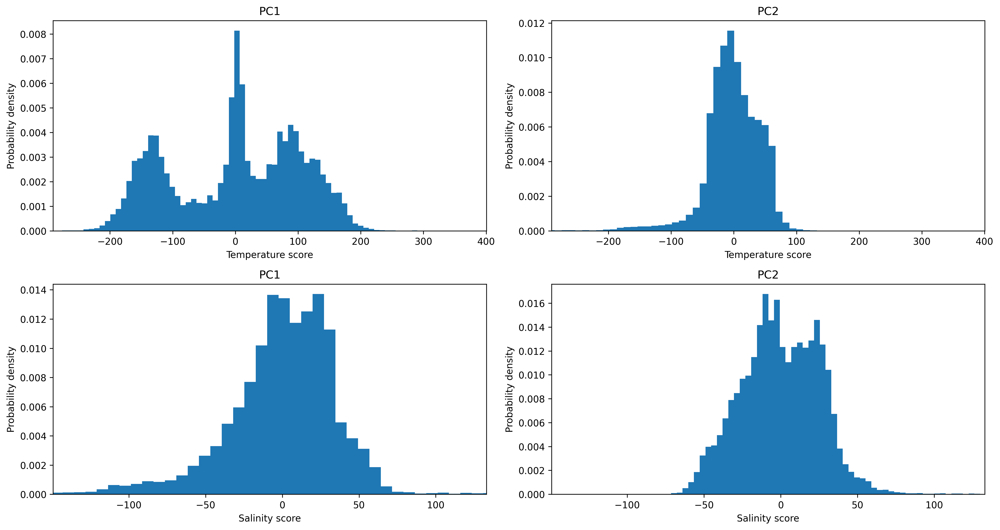

In [33]:
temp_san_score=pca_score(ds_cleaned_750)

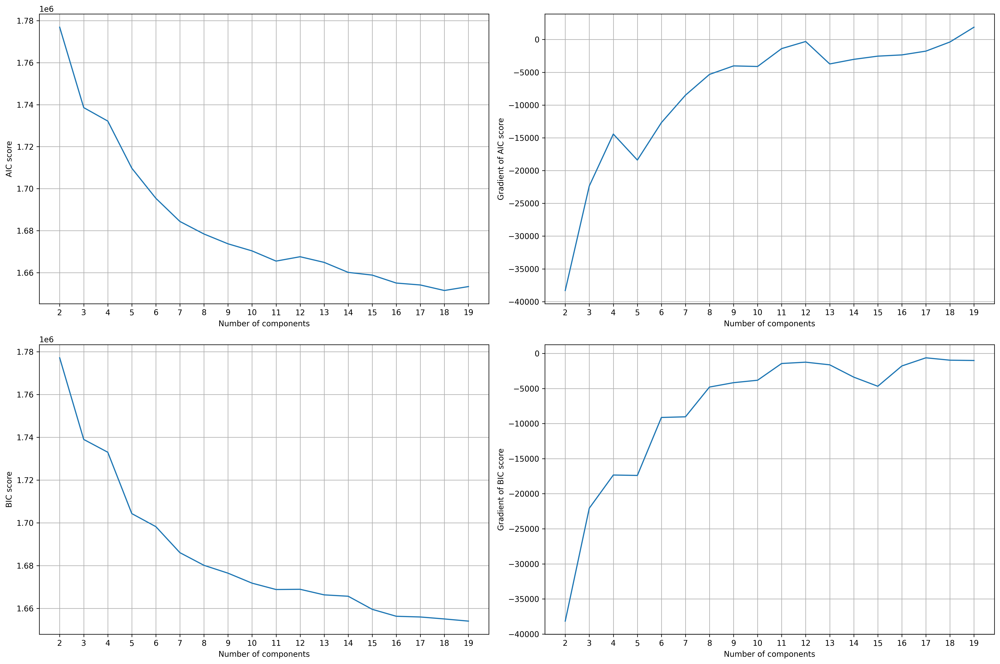

In [40]:
aic_bic_curve(temp_san_score, max_components=20)

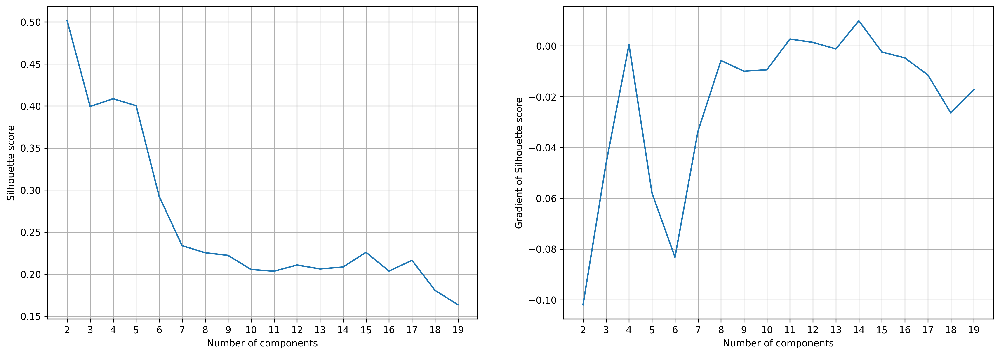

In [49]:
silhouette_score_curve(temp_san_score, max_components=20)

variation explained by PC1 and PC2 for temperature: [0.77213817 0.09876301]
variation explained by PC1 and PC2 for salinity: [0.72888083 0.12812712]


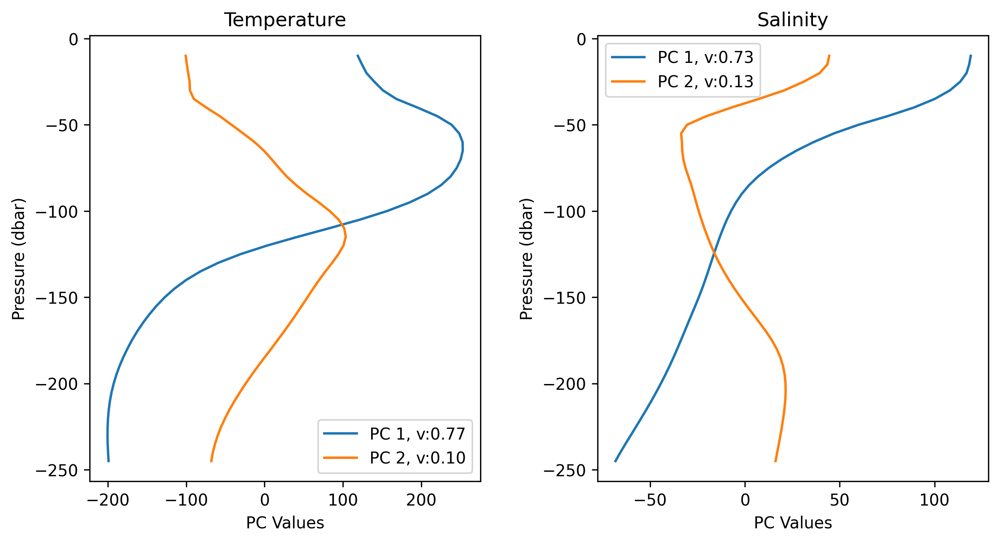

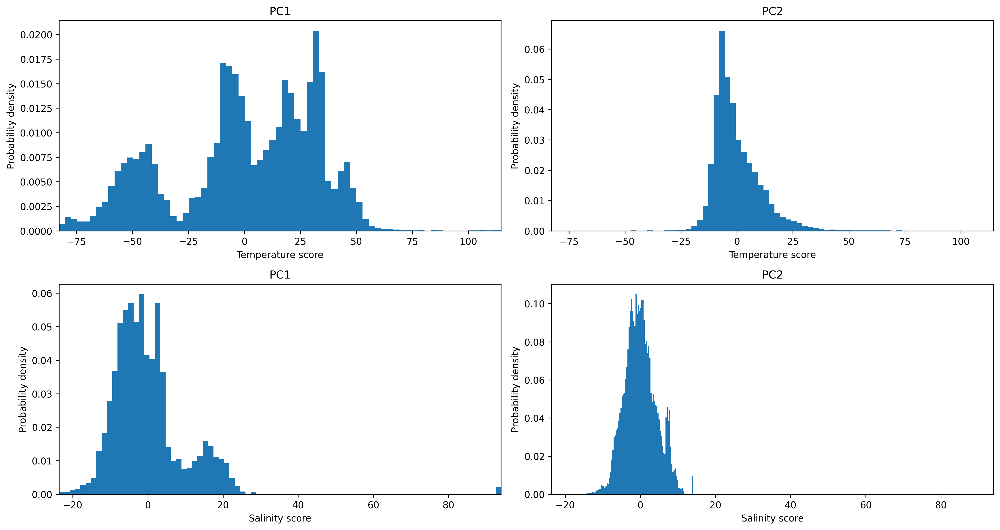

In [52]:
temp_san_score_250=pca_score(ds_cleaned_250)

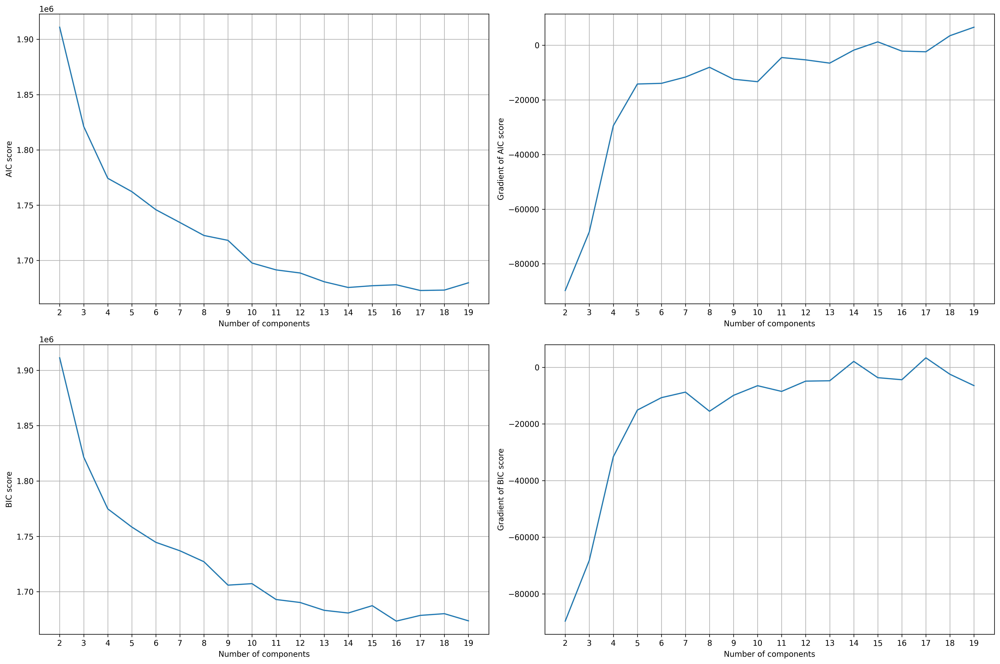

In [53]:
aic_bic_curve(temp_san_score_250, max_components=20)

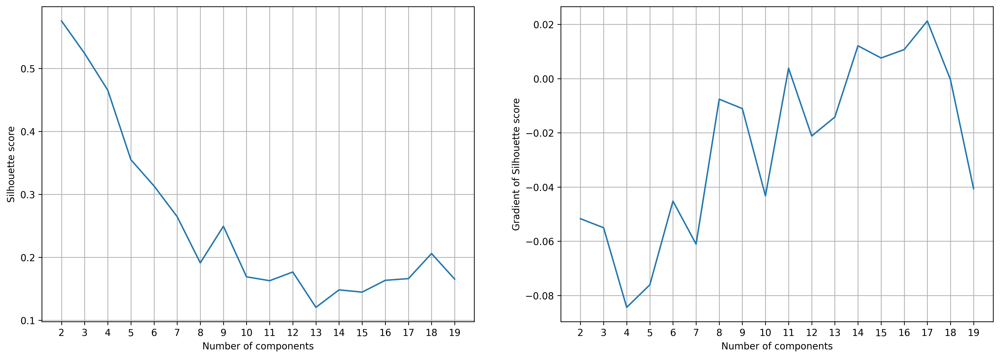

In [54]:
silhouette_score_curve(temp_san_score_250, max_components=20)

In [7]:
# pca
from sklearn.decomposition import PCA
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
import numpy as np
import pandas as pd


# Normalize the data
scaler = StandardScaler()
temp_scaled = scaler.fit_transform(ds_cleaned['temperature'].values)
san_scaled = scaler.fit_transform(ds_cleaned['salinity'].values)

n_pc=2  # number of principal components
pca_T = PCA(n_components=n_pc)
pca_S=PCA(n_components=n_pc)
columns = [f'pc {i}' for i in range(1, n_pc+1)]

pca_temp = pca_T.fit_transform(temp_scaled.T)
pca_temp_df = pd.DataFrame(data = pca_temp
             , columns = columns)

# pca for salinity
pca_san = pca_S.fit_transform(san_scaled.T)
pca_san_df = pd.DataFrame(data = pca_san
                , columns = columns)

# temp_score=temp_scaled.dot(pca_temp)
# san_score=san_scaled.dot(pca_san)

temp_score=temp_scaled.dot(zscore(pca_temp))
san_score=san_scaled.dot(zscore(pca_san))

# temp_scores = pca_T.transform(temp_scaled)
# temp_loadings = temp_scores.dot(pca_T.components_)

# san_scores = pca_S.transform(san_scaled)


v_exp_temp = pca_T.explained_variance_ratio_
v_exp_san = pca_S.explained_variance_ratio_




In [9]:
pca_temp


array([[ 129.95134126,  167.13267323],
       [ 120.42128625,  167.66844267],
       [ 114.28398408,  164.21644524],
       [ 115.30073132,  157.34019035],
       [ 121.7773932 ,  146.53416723],
       [ 133.07083301,  133.53822634],
       [ 149.05986058,  117.55297751],
       [ 163.89639478,  107.35344497],
       [ 174.76139467,  102.23280342],
       [ 180.25937659,  101.96552408],
       [ 182.23788974,  105.08239016],
       [ 182.04106439,  110.14837566],
       [ 179.919199  ,  115.79168672],
       [ 176.14376933,  120.18505278],
       [ 170.1893982 ,  123.16398815],
       [ 160.13502179,  124.71828974],
       [ 144.8854249 ,  125.21021659],
       [ 122.67044982,  124.16901931],
       [  93.51945118,  121.04473685],
       [  56.71204804,  114.80532681],
       [  15.37951041,  105.24389132],
       [ -24.97847873,   93.13552685],
       [ -59.90968919,   80.48381805],
       [ -87.3088613 ,   68.82977094],
       [-107.25682216,   58.63884922],
       [-121.81737644,   

In [10]:
temp_score

array([[ 85.22104396, -27.73526442],
       [ 79.90884239, -36.43476123],
       [ 67.62391195, -38.94961239],
       ...,
       [  8.37523584,  55.50090927],
       [-10.52492173,  62.89912898],
       [  3.89146776,  60.13010665]])

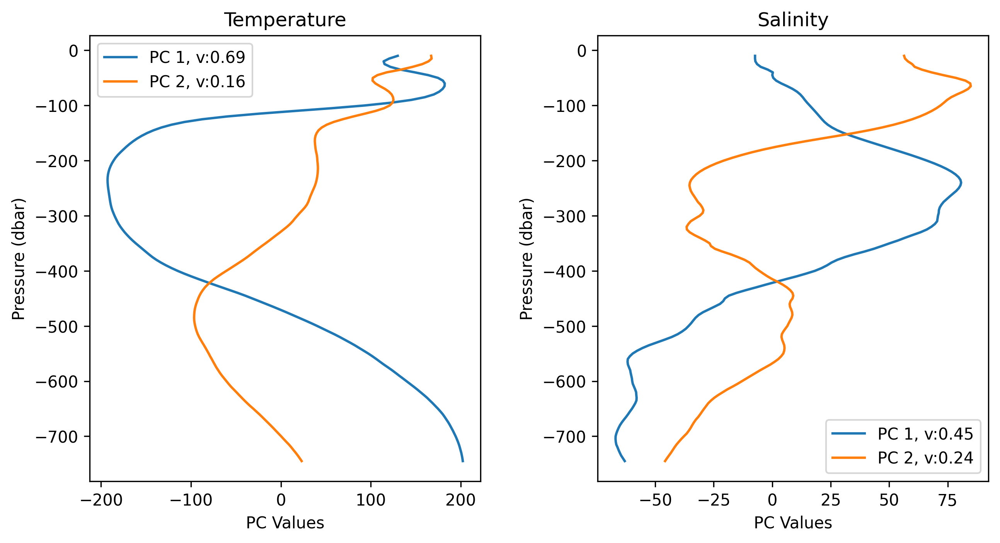

In [11]:
import matplotlib.pyplot as plt

# Create a figure with two subplots side by side
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10,5),dpi=300)

# Loop through all the PCs and plot them for temperature and salinity
for i in range(n_pc):
    # Plot the i-th PC for temperature in the left subplot
    axes[0].plot(pca_temp_df[f'pc {i+1}'], ds_cleaned['pressure'], label=f'PC {i+1}, v:{v_exp_temp[i]:.2f}')
    axes[0].set_title('Temperature')
    axes[0].set_xlabel('PC Values')
    axes[0].set_ylabel('Pressure (dbar)')
    # axes[0].invert_yaxis()
    axes[0].legend()
    
    # Plot the i-th PC for salinity in the right subplot
    axes[1].plot(pca_san_df[f'pc {i+1}'], ds_cleaned['pressure'], label=f'PC {i+1}, v:{v_exp_san[i]:.2f}')
    axes[1].set_title('Salinity')
    axes[1].set_xlabel('PC Values')
    axes[1].set_ylabel('Pressure (dbar)')
    # axes[1].invert_yaxis()
    axes[1].legend()
    

# Adjust the spacing between the subplots
fig.subplots_adjust(wspace=0.3)

# Show the figure
plt.show()



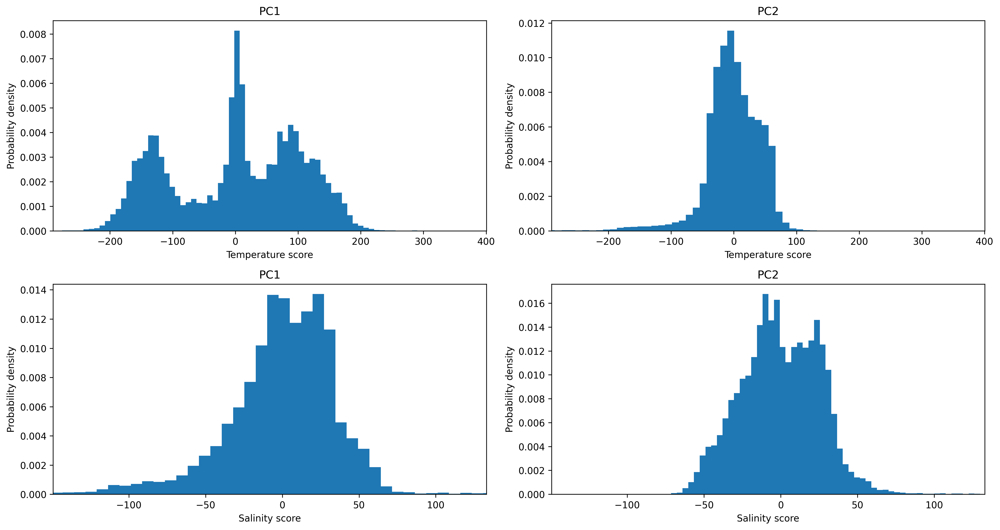

In [12]:

# plot the scores
import matplotlib.pyplot as plt

n_cols = temp_score.shape[1]  # number of principal components
fig, axs = plt.subplots(nrows=2, ncols=n_cols, figsize=(15, 8),dpi=300)

for i in range(n_cols):
    axs[0,i].hist(temp_score[:, i], bins=100,density=True)
    axs[0,i].set_xlim(np.quantile(temp_score,0.001), np.quantile(temp_score,0.999))
    axs[0,i].set_title(f'PC{i+1}')
    axs[0,i].set_xlabel('Temperature score')
    axs[0,i].set_ylabel('Probability density')
    #axs[0,i].set_yticklabels([str(int(ytick/len(temp_score))) for ytick in axs[0,i].get_yticks()])  # set ytick labels divided by 2

    axs[1,i].hist(san_score[:, i], bins=100,density=True)
    axs[1,i].set_xlim(np.quantile(san_score,0.001), np.quantile(san_score,0.999))
    axs[1,i].set_title(f'PC{i+1}')
    axs[1,i].set_xlabel('Salinity score')
    axs[1,i].set_ylabel('Probability density')
    # axs[1,i].set_yticklabels([str(int(ytick/len(temp_score))) for ytick in axs[1,i].get_yticks()])  # set ytick labels divided by 2

plt.tight_layout()
plt.show()



In [16]:
# put temperature and salinity scores together
temp_san_score=np.concatenate((temp_score,san_score),axis=1)
temp_san_score.shape

(44692, 4)

In [36]:
# calculate the bic score for the GMM model
from sklearn.mixture import GaussianMixture
gmm_model = GaussianMixture(n_components=6, covariance_type='full')
gmm_model.fit(temp_san_score)
# gmm_model.bic(temp_san_score)
gmm_model.aic(temp_san_score)


1690931.4456806974

In [41]:
# calculate the silhouette_score
from sklearn.metrics import silhouette_score
ss=silhouette_score(temp_san_score, gmm_model.predict(temp_san_score))
ss

0.2925861847462756

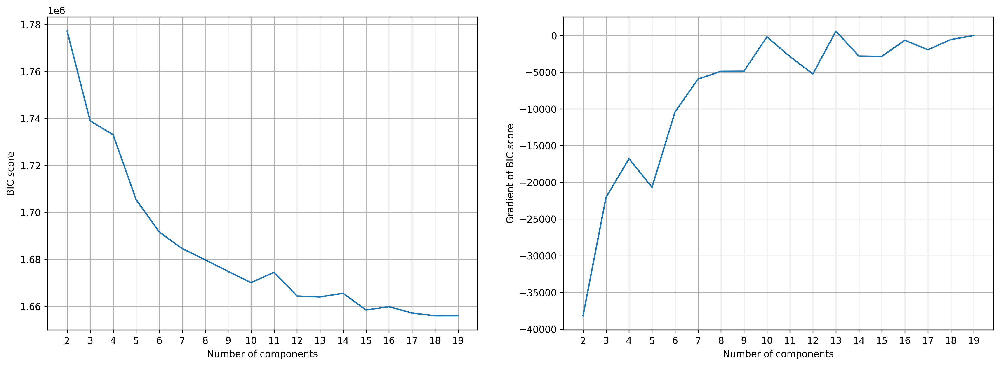

In [20]:
# set n_components to 2 to 10 and calculate the bic score for each model and plot the results
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt

max_components = 20
bic = []
for i in range(2, max_components):
    gmm_model = GaussianMixture(n_components=i, covariance_type='full')
    gmm_model.fit(temp_san_score)
    bic.append(gmm_model.bic(temp_san_score))

# calculate the gradient of bic
bic_grad = np.gradient(bic)
# plot bic and bic_grad vs n_components side by side
plt.figure(figsize=(18, 6),dpi=300)
plt.subplot(1, 2, 1)
plt.plot(range(2, max_components), bic)
# set xticks to be integers
plt.xticks(range(2, max_components))
plt.xlabel('Number of components')
plt.ylabel('BIC score')
plt.grid()
plt.subplot(1, 2, 2)
plt.plot(range(2, max_components), bic_grad)
# set xticks to be integers
plt.xticks(range(2, max_components))
plt.xlabel('Number of components')
plt.ylabel('Gradient of BIC score')
# add grid
plt.grid()
plt.show()